#  __Using <font color=blue><a href=https://mlbi-lab.net>SCODA</a></font> for Single-cell RNA-seq data analysis and mining__

- This Jupyter notebook provides example code for visualizing and mining the results processed by <a href=https://mlbi-lab.net>__SCODA__</a>, a single-cell RNA-seq data analysis pipeline developed by __MLBI Lab__.
- Data mining is conducted using the __SCODA-viz__ package and includes the following components:

<br>

1. <font color=blue>Review of cell type annotation results</font>
   - Preprocessing for visualization and generation of UMAP coordinates
   - Visualization of celltype marker expression patterns
   - Examination of cell type populations and identification of condition-specific features
2. <font color=blue>Review of CNV and tumor cell identification results</font>
   - Visualization of CNV patterns via heatmap
   - Tumor cell identification confirmed via UMAP projection
3. <font color=blue>Profiling of ligand–receptor interactions between cell types</font>
  - Structure and composition of CCI result data
  - Visualization using dot plots and circle plots
  - Statistical testing of condition-specific interactions and visualization via boxplots
4. <font color=blue>Differential expression analysis and marker/target discovery</font>
  - Structure of DEG result data
  - Inspection of DEG results
  - Marker/target discovery and visualization using dot plots
5. <font color=blue>Gene set analysis (GSA) and interpretation of enrichment results</font>
  - Structure of GSA/GSEA output data
  - Visualization of GSA/GSEA results using barplots
  - Visualization of GSA/GSEA results using dotplots

6. <font color=firebrick>Auxiliary analysis using cancer genomics big data</font> (e.g., METABRIC or TCGA data)
7. <font color=firebrick>Visualization of pathway-level changes using KEGG Pathview</font> (provided in a separate notebook using R)

<br>

__MLBI-lab, July 27, 2025__

contact: mlbi@mlbi-lab.com



## __1. Install required packages and import them__

In [ ]:
## 필요한 패키지 설치 (이미 설치되었다면 skip 해도 됩니다.)
'''
!pip install gdown
!pip install numpy
!pip install pandas
!pip install scipy
!pip install matplotlib
!pip install scikit-learn
!pip install seaborn
!pip install scikit-network
!pip install statannot
!pip install statannotations
!pip install lifelines
!pip install plotly
'''
!pip install scanpy
!pip install scoda-viz==0.4.7
## This jupyter notebook was tested with the above version of scoda-viz package.

In [ ]:
## 필요한 패키지 불러오기
import copy, warnings, os
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

from scodaviz import plot_population, plot_population_grouped
from scodaviz import plot_cci_dot, plot_cci_circ_group
from scodaviz import plot_gsa_bar, plot_gsa_dot
from scodaviz import plot_deg, plot_marker_exp
from scodaviz import plot_cnv, plot_violin, plot_pct_box
from scodaviz import get_sample_to_group_map, plot_sankey

from scodaviz import get_population, get_cci_means, get_gene_expression_mean
from scodaviz import get_markers_from_deg, test_group_diff, filter_gsa_result
from scodaviz import find_condition_specific_markers, find_genomic_spots_of_cnv_peaks
from scodaviz import load_scoda_processed_sample_data, get_abbreviations

warnings.filterwarnings('ignore')

https://github.com/combio-dku
INFO: statannotations was sucessfully installed.


## __2A. Download a preprocessed data__

In [ ]:
dataset = 'BC'  ## You can choose one of ['BC', 'NSCLC', 'PDAC', 'CRC', 'Colitis-mm', 'Colitis-hs']
adata_t = load_scoda_processed_sample_data( dataset )
adata_t

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1XbX8Q3dH1kOWnM6ppms4BR2ukEAKYisB
From (redirected): https://drive.google.com/uc?export=download&id=1XbX8Q3dH1kOWnM6ppms4BR2ukEAKYisB&confirm=t&uuid=e078a760-2921-400f-a443-db61de685fc4
To: /content/downloaded
100%|██████████| 258M/258M [00:03<00:00, 79.0MB/s]


File saved to: BRCA_428K_GSE161529_33K_v1.h5ad


AnnData object with n_obs × n_vars = 33742 × 22585
    obs: 'Patient', 'Description', 'Source', 'Condition', 'Menopause', 'Parity', 'Gender', 'geo_no', 'sid', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'subtype', 'subtype_detail', 'tissue', 'condition', 'sample', 'copykat_dec', 'scevan_dec', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'ploidy_init_group', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind'
    var: 'variable_genes', 'chr', 'spot_no'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_neighbors_info', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'X_pca', 'i

## __2B. Or, load your h5ad file__
데이터를 불러오려면 호스팅 된 Colab 서버에 h5ad파일을 직접 업로드하거나 본인 계정의 구글 드라이브를 마운트하여 가져와야 합니다.

In [ ]:
file_h5ad = 'BRCA_428K_GSE161529_33K_v1.h5ad'

In [ ]:
adata_t = sc.read_h5ad(file_h5ad)
adata_t

## __3. Check your SCODA-processed data__

#### __AnnData Format__
  
<div>
<img src="https://drive.google.com/uc?export=view&id=1IGjZpO_DeaNFiX3u_fy_rnPC1oKwVsqU" align="center" width="500"/>
</div>
<div>
<img src="attachment:fefeae20-ad05-4cea-8327-72f3dd19903f.png" width="500"/>
</div>

https://anndata.readthedocs.io/en/stable/

#### __Basic operations__
1. cell selection, gene selection (supports boolean indexing as for DataFrame)
3. writing to a file
4. getting cell-by-gene count matrix as a data frame
5. adding an annotation

In [ ]:
adata_t

In [ ]:
adata_t.obs.head()

In [ ]:
## Cell-selection example
b = adata_t.obs['celltype_major'] == 'Epithelial cell'
adata = adata_t[b,:]
adata

In [ ]:
## Example: writing anndata to a file
adata.write('Epi_only.h5ad')

In [ ]:
## Example: getting cell-by-gene count matrix as a data frame
X_full = adata.to_df()
X_full.head()

-  #### SCODA를 이용하여 생성된 결과
    - __적용된 분석 파라미터__: adata_t.uns['analysis_parameters']
    - __celltype annotation 결과__: adata_t.obs[['celltype_major', 'celltype_minor', 'celltype_subset']]
    - __celltype annotation 결과의 상세내용__: adata_t.obsm['HiCAT_result']
    - __celltype annotation에 사용된 celltype marker 정보__: adata_t.uns['Celltype_marker_DB']
    - __InferCNV 결과__: adata_t.obsm['X_cnv'], adata_t.obsm['X_cnv_pca'], adata_t.obs[['cnv_score', 'cnv_cluster']]
    - __InferCNV 분석 파라미터 및 관련 정보__: adata_t.uns['cnv'], adata_t.uns['cnv_neighbors_info'], adata_t.uns['cnv_ref_celltypes']
    - __InferPloidy 결과__: adata_t.obs[['ploidy_dec', 'ploidy_score']
    - __Cell간 상호작용 추론 결과__: adata_t.uns['CCI_sample'] (샘플별), adata_t.uns['CCI'] (조건별)
    - __DEG 결과__: adata_t.uns['DEG'], adata_t.uns['DEG_stat']
    - __GSA/GSEA 결과__: adata_t.uns['GSA_down'], adata_t.uns['GSA_up'], adata_t.uns['GSEA']

In [ ]:
adata_t.obs[['sample', 'condition']].value_counts()

In [ ]:
lst = [adata_t.obs['condition'], adata_t.obs['sample']]
plot_sankey(lst, title=None, fs=12, WH=(400, 600), th=30, title_y=0.85 )

In [ ]:
lst = [adata_t.obs['celltype_subset'], adata_t.obs['celltype_minor'], adata_t.obs['celltype_major']]
plot_sankey(lst, title=None, fs=12, WH=(700, 800), th=30, title_y=0.85 )

In [ ]:
adata_t.obs['celltype_major'].value_counts()

In [ ]:
adata_t.obs['celltype_minor'].value_counts()

In [ ]:
adata_t.uns['analysis_parameters']

In [ ]:
adata_t.obsm['HiCAT_result']

## __4. Explore your data__
A. <font color=blue>세포유형 식별결과 확인</font>
   - 시각화를 위한 기본 처리 및 UMAP 좌표 생성
   - 세포유형 마커 발현 패턴 확인
   - 세포유형 population 확인 및 조건특이적 특징 판별

B. <font color=blue>CNV 및 암세포 식별 결과 확인</font>
   - CNV heatmap 확인
   - UMAP을 통한 암세포 식별 결과 확인

C. <font color=blue>세포유형간 ligand-receptor 상호작용 프로파일</font>
   - 결과 데이터의 구성
   - dot plot 및 circle plot을 이용한 확인
   - 조건-특이적 상호작용의 통계적 검정 및 boxplot을 이용한 확인     

D. <font color=blue>DEG 분석 결과 및 마커/표적 탐색</font>
   - DEG 결과 데이터의 구성
   - DEG 결과의 확인
   - 마커/표적 탐색 및 dotplot을 이용한 확인

E. <font color=blue>유전자 집합 분석(Gene Set Analysis) 결과 확인</font>
  - GSA/GSEA 결과 데이터의 구성
  - barplot을 이용한 GSA/GSEA 결과의 확인
  - dotplot을 이용한 GSA/GSEA 결과의 확인

F. <font color=firebrick>암유전체 빅데이터의 보조적 활용</font>

G. <font color=firebrick>KEGG pathview 생성하여 pathway상의 변화 확인</font> (별도의 주피터 노트북 제공)

In [ ]:
## Retreive celltype abbreviations
rename_dict = get_abbreviations()

## Retreive same to condition mapping
sample_group_map = adata_t.uns['lut_sample_to_cond']

### __A.1 Basic preprocessing for UMAP projection__

In [ ]:
## adata_t의 사본을 만들어서 adata에 저장
adata = adata_t[:,:]
## 이렇게하면 adata에 대해 처리한 내용이 원본에는 반영되지 않음

## UMAP 프로젝션을 얻기 위한 기본적 처리과정
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes = 2000)
sc.tl.pca(adata, n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15, use_rep = 'X_pca')
sc.tl.umap(adata)

In [ ]:
adata

AnnData object with n_obs × n_vars = 33742 × 22585
    obs: 'Patient', 'Description', 'Source', 'Condition', 'Menopause', 'Parity', 'Gender', 'geo_no', 'sid', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'subtype', 'subtype_detail', 'tissue', 'condition', 'sample', 'copykat_dec', 'scevan_dec', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'ploidy_init_group', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind'
    var: 'variable_genes', 'chr', 'spot_no', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_neighbors_info', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_par

### __A.2 An overview of celltype annotation result__

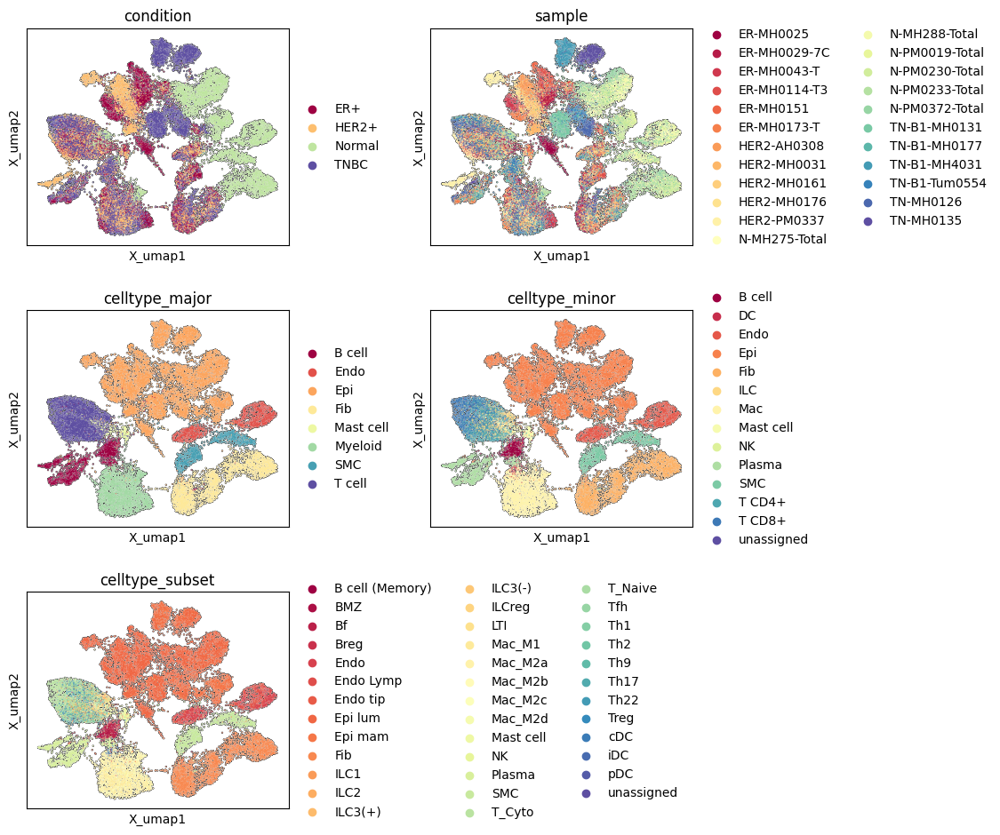

In [ ]:
items_to_plot = ['condition', 'sample',
                 'celltype_major', 'celltype_minor', 'celltype_subset']

## Abbreviate cell names
cols = ['celltype_major', 'celltype_minor', 'celltype_subset']
for col in cols:
    adata.obs[col] = adata.obs[col].astype(str)
    adata.obs[col].replace(rename_dict[col], inplace = True)

plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                 color=items_to_plot, wspace = 0.4, hspace = 0.3, legend_fontsize = 10,
                 ncols = 2, palette = 'Spectral', add_outline = True)

- __HiCAT:__ https://github.com/combio-dku/HiCAT

### __A.3 Inspecting minor-type annotation result__

In [ ]:
adata.obs['celltype_minor'].value_counts()

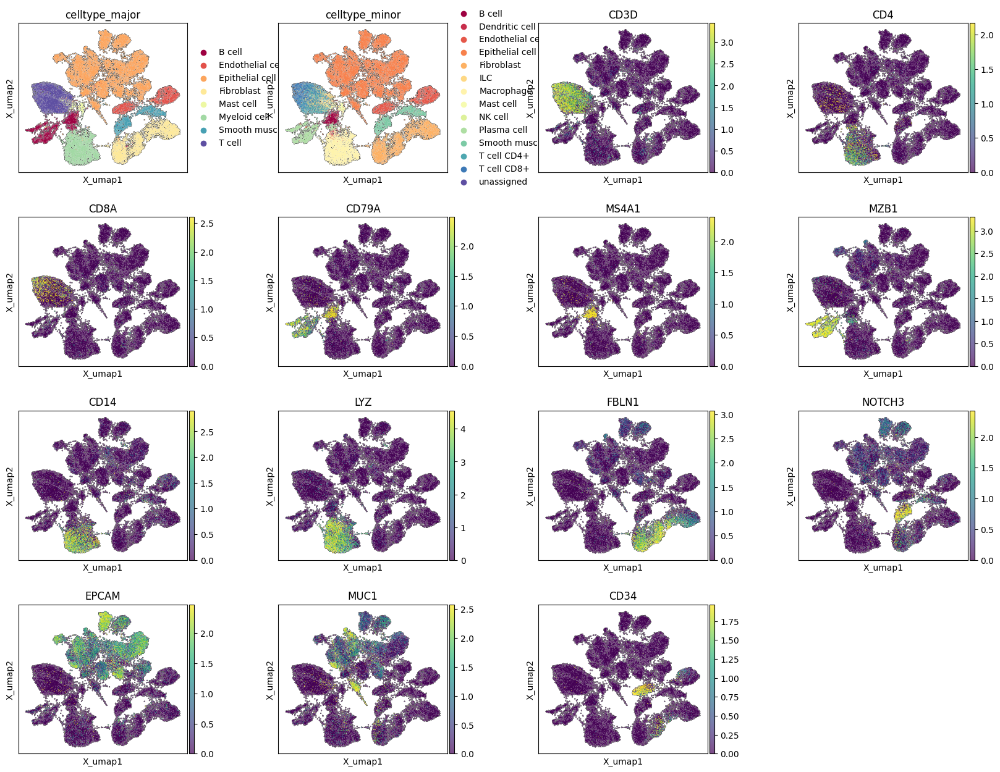

In [ ]:
items_to_plot = ['celltype_major', 'celltype_minor']

if adata_t.uns['usr_param']['species'] == 'human':
    genes = ['CD3D', 'CD4', 'CD8A', 'CD79A', 'MS4A1', 'MZB1',
             'CD14', 'LYZ', 'FBLN1', 'NOTCH3', 'EPCAM', 'MUC1',  'CD34']
else:
    genes = ['Cd3d', 'Cd4', 'Cd8a', 'Cd79a', 'Ms4a1', 'Mzb1',
             'Cd14', 'Lyz', 'Fbln1', 'Notch3', 'Epcam', 'Muc1',  'Cd34']

## 위 목록의 마커 유전자들 중 현재의 데이터에 있는 유전자들만 순서대로 선택
genes_all = list(adata.var.index.values)
items_to_plot = items_to_plot + [g for g in genes if g in genes_all]

plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                 color=items_to_plot, wspace = 0.4, hspace = 0.3,
                 legend_fontsize = 10,ncols = 4, palette = 'Spectral',
                 add_outline = True, vmax = 'p99', vmin = 0)

#### __A.4 Subset marker expression profile__
- Subset annotation은 UMAP으로 확인하기 어려우므로 dot plot을 사용하여 확인
- dot의 크기는 annotation 결과 기준으로 해당 유형의 세포 중 얼마나 많은 비율이 해당 유정의 마커 유전자를 발현하고 있는지 보여줌


Num markers selected: 167 -> 120


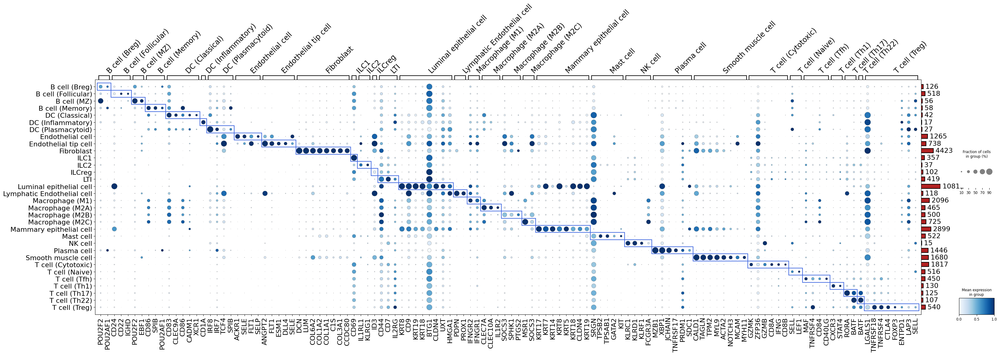

In [ ]:
plot_marker_exp(  adata_t, markers = None,
                  N_cells_per_group_min = 10, N_markers_per_group_max = 8, N_markers_total = 120,
                  title = None, title_y_pos = 1.1, title_fs = 30,
                  text_fs = 16, standard_scale = 'var',
                  var_group_rotation = 45, var_group_height = 1.2,
                  nz_frac_max = 0.9, nz_frac_cutoff = 0.05,
                  rem_mkrs_common_in_N_groups_or_more = 3,
                  figsize = None, swap_ax = False, legend = True,
                  cmap = 'Blues', linewidth = 1.5, linecolor = 'royalblue')

### __Practice:__ Visualizing T-cell subsets

In [ ]:
b = adata_t.obs['celltype_major'] == 'T cell'
adata = adata_t[b,:]

## UMAP 프로젝션을 얻기 위한 기본적 처리과정
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes = 1000)
sc.tl.pca(adata, n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15, use_rep = 'X_pca')
sc.tl.umap(adata)

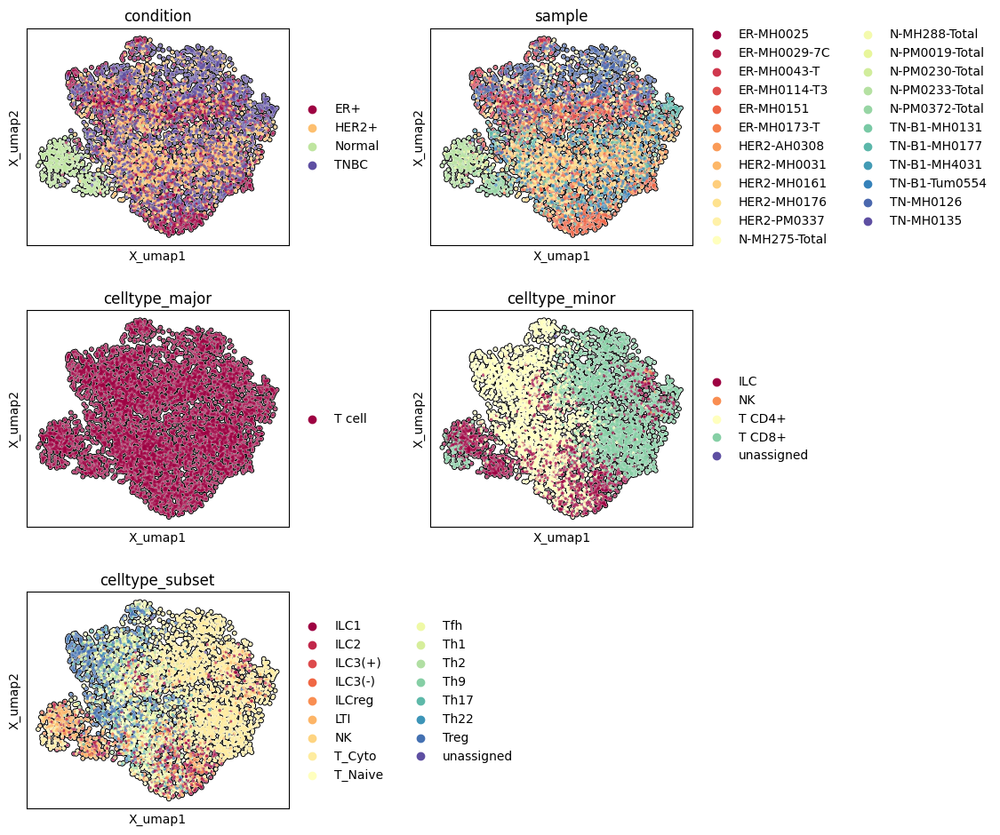

In [ ]:
items_to_plot = ['condition', 'sample',
                 'celltype_major', 'celltype_minor', 'celltype_subset']

cols = ['celltype_major', 'celltype_minor', 'celltype_subset']
for col in cols:
    adata.obs[col] = adata.obs[col].astype(str)
    adata.obs[col].replace(rename_dict[col], inplace = True)

plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                 color=items_to_plot, wspace = 0.4, hspace = 0.3, legend_fontsize = 10,
                 ncols = 2, palette = 'Spectral', add_outline = True)

### __A.5 Inspecting celltype population__


In [ ]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
celltype_col = 'celltype_minor' ## 세포 유형의 기준
df_cnt, df_pct= get_population( adata_t.obs['sample_ext'],
                                adata_t.obs[celltype_col], sort_by = [] )
## 샘플별 세포 개수 확인
display(df_pct.round(1))

plot_population( df_pct, bar_width = 0.6,
                 title = celltype_col, title_fs = 14,
                 label_fs = 12, tick_fs = 10, xtick_rot = 45, xtick_ha = 'right',
                 legend_fs = 9, legend_loc = 'upper left', bbox_to_anchor = (1,1),
                 legend_ncol = 1, cmap = None, figsize=(6, 2), dpi = 100)

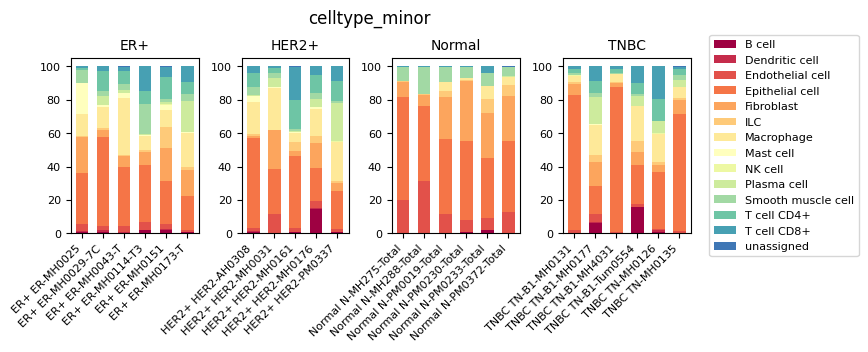

In [ ]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
celltype_col = 'celltype_minor' ## 세포 유형의 기준
df_cnt, df_pct= get_population( adata_t.obs['sample_ext'],
                                adata_t.obs[celltype_col], sort_by = [] )

plot_population_grouped( df_pct, sample_group_map, sort_by = [], bar_width = 0.6,
                         title = celltype_col, title_fs = 12, title_y_pos = 1.2,
                         label_fs = 10, tick_fs = 8, xtick_rot = 45, xtick_ha = 'right',
                         legend_fs = 8, legend_loc = 'center left', bbox_to_anchor = (1.1,0.5),
                         legend_ncol = 1, cmap = None, figsize=(7, 2), dpi = 100,
                         wspace = 0.35, hspace = 0.2 )

### __A.6 Inspecting condition-specificity in celltype population__

In [ ]:
## 요부분은 sample 별 population을 얻어 조건별로 population이 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커짐 (p-value가 작아짐)

df_res = test_group_diff( df_pct, sample_group_map, ref_group = None, pval_cutoff = 0.8 )
display(df_res)

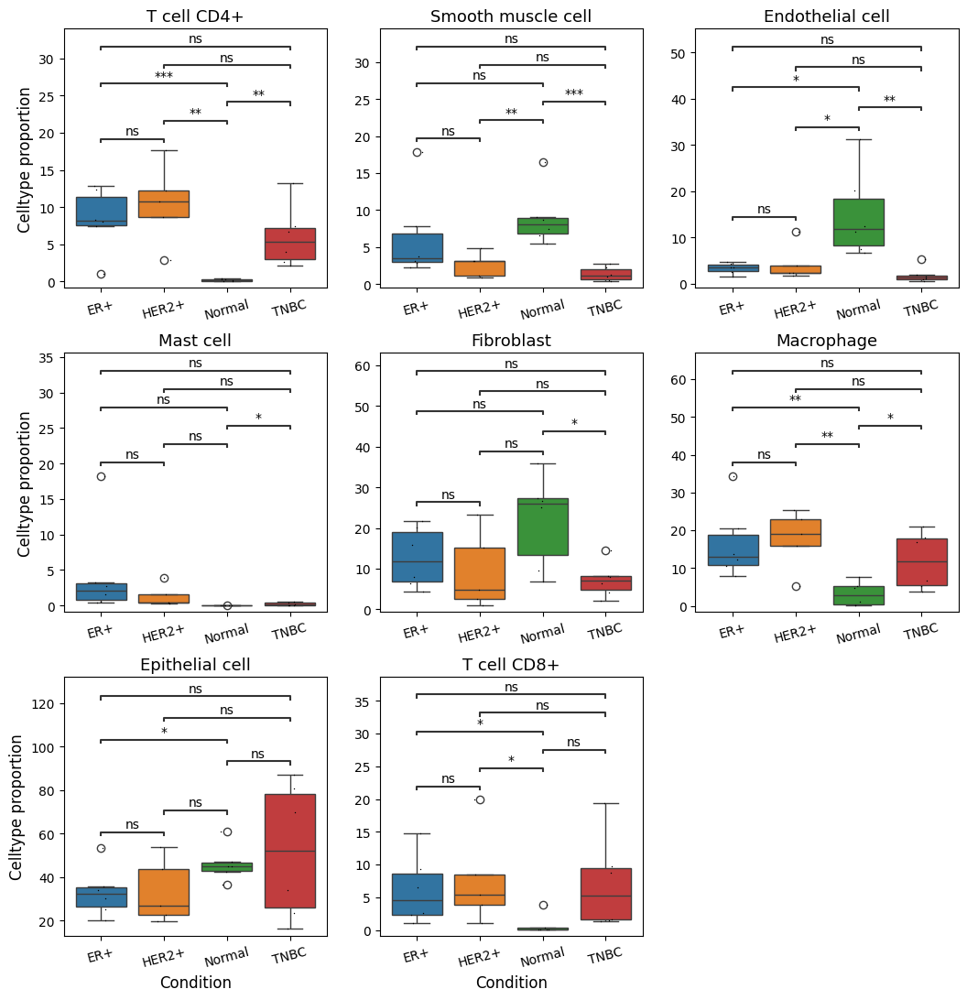

In [ ]:
## 표시할 결과 항목을 선택: 최대 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    ## Show the first 5 CCIs
    plot_pct_box(df_pct[idx_sel], sample_group_map, ylabel = 'Celltype proportion',
                 ncols = 3, figsize = (3.5,3.5), dpi = 100,
                 group_order = None, # ['Normal', 'ER+', 'HER2+', 'TNBC'],
                 title = None, title_y_pos = 1.05, title_fs = 15,
                 label_fs = 12, tick_fs = 10, xtick_rot = 15,
                 annot_ref = None, annot_fmt = 'star', annot_fs = 10,
                 ws_hs = (0.2, 0.25), stripplot = True, cmap = 'tab10')

#### __Practice: Inspecting subset population__

In [ ]:
## 특정 세포유형의 subset별 상대비율을 얻기 위해 특정 세포 유형만 선택
## 이 경우 Macrophage subset의 상대비율을 보기 위해 먼저 minor type이 macrophage인 cell들만 선택
b = adata_t.obs['celltype_minor'] == 'T cell CD4+'
adata_s = adata_t[b,:]

## 샘플별로 macrophage subset의 개수와 상대비율을 얻어서 데이터프레임에 저장
col = 'celltype_subset'
df_cnt, df_pct = get_population( adata_s.obs['sample_ext'], adata_s.obs[col], sort_by = [] )
display(df_cnt)

plot_population_grouped( df_pct, sample_group_map, sort_by = [],
                         title = col, title_fs = 12, title_y_pos = 1.2,
                         label_fs = 10, bar_width = 0.6,
                         tick_fs = 8, xtick_rot = 45, xtick_ha = 'right',
                         legend_fs = 8, legend_loc = 'upper left',
                         bbox_to_anchor = (1,1), legend_ncol = 1,
                         cmap = None, figsize=(7, 2), wspace = 0.35, dpi = 100)

### __B. CNV & tumor cell identification 결과__
#### <font color=blue>(This works only if you checked "Tumor cell Identification" box when running SCODA)</font>

- __InferCNVpy:__ https://infercnvpy.readthedocs.io/en/latest/infercnv.html
- __InferPloidy:__

### __B.1 Inspecting CNV estimates using heatmap__
- We first group the cells into appropriate groups
- then compare the CNV patterns of the resulting cell groups using a heatmap.

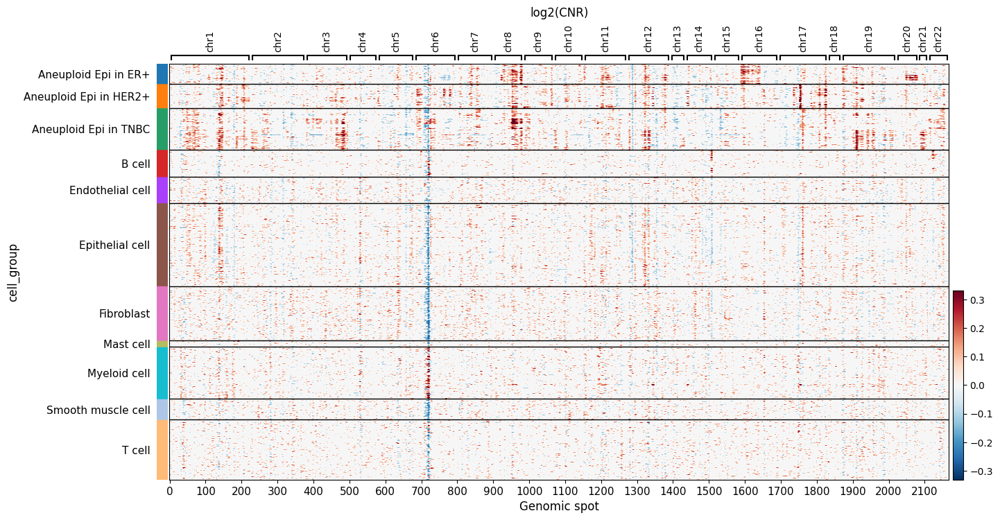

In [ ]:
## adata_t의 사본을 만들어서 adata에 저장
## 이렇게하면 adata에 대해 처리한 내용이 원본에는 반영되지 않음
adata = adata_t[:,:]

## cell들을 Grouping 하기 위해 obs 필드에 'cell_group' 열을 새로 정의
## 기본적으로 major type의 이름을 사용
adata.obs['cell_group'] = adata.obs['celltype_major'].copy(deep = True).astype(str)

## condition 열에 정의된 유방암 subtype에 따라 암세포로 식별된 세포들의
## 이름에 유방암 subtype을 추가하여 이름 변경
## 예: condition이 ER+인 샘플중 Tumor cell들은 이름을 'Tumor ER+'로 변경
cond_col = 'condition'
clst = adata.obs[cond_col].unique()
for c in clst:
    b = (adata.obs[cond_col] == c) & (adata.obs['ploidy_dec'] == 'Aneuploid')
    s = 'Aneuploid Epi in %s' % c
    adata.obs.loc[b, 'cell_group'] = s

## 'cell_group'열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
axd = plot_cnv( adata, groupby = 'cell_group', N_cells_min = 200,
                title = 'log2(CNR)', title_fs = 12, title_y_pos = 1.1,
                label_fs = 12, tick_fs = 11,
                figsize = (15, 8), swap_axes = False,
                var_group_rotation = 90, cmap='RdBu_r', vmax = 1,
                cnv_obsm_key = 'X_cnv', cnv_uns_key = 'cnv', show_ticks = True,
                xlabel = 'Genomic spot', xtick_rot = 0, xtick_ha = 'center')

### __B.2 Comparison of CNV patterns across samples using only cells identified as tumor cells__

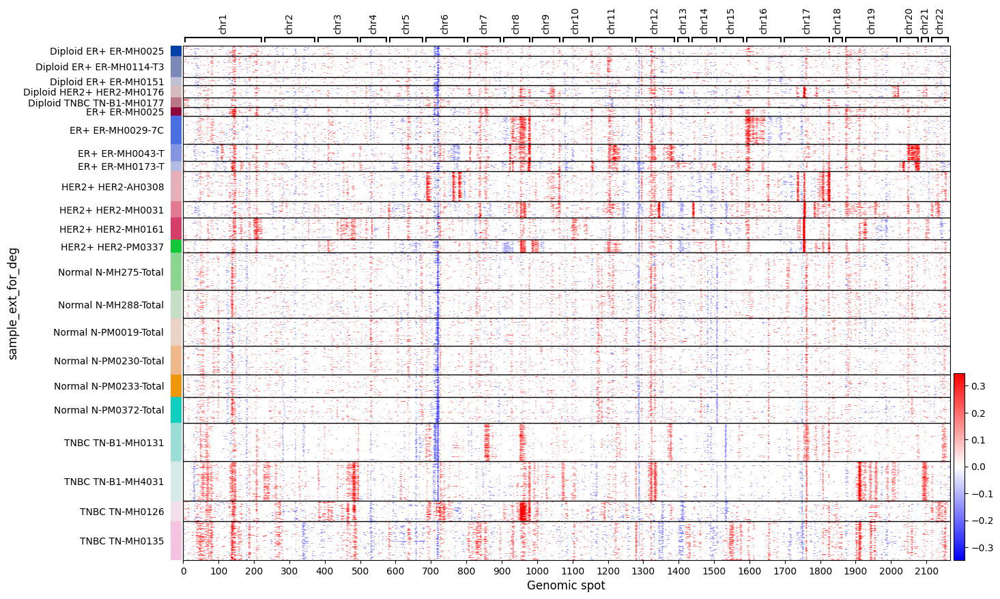

In [ ]:
b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

cell_grouping = 'sample_ext_for_deg'

## cell_grouping열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
axd = plot_cnv( adata_s, groupby = cell_grouping, N_cells_min = 200,
                title = None, title_fs = 12, title_y_pos = 1.1,
                label_fs = 12, tick_fs = 10,
                figsize = (15, 10), swap_axes = False,
                var_group_rotation = 90, cmap='bwr', vmax = 1,
                cnv_obsm_key = 'X_cnv', cnv_uns_key = 'cnv', show_ticks = True,
                xlabel = 'Genomic spot', xtick_rot = 0, xtick_ha = 'center')

### __B.3 Finding genomic spots where CNV has a peak__

In [ ]:
## Select cells of interest
b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

cnv_peaks = find_genomic_spots_of_cnv_peaks( adata_s, group_col = 'condition', width = 5, std_scale = 5, q = None )
cnv_peaks

{'ER+': {np.int64(145): array(['FLAD1', 'ZBTB7B', 'DCST2', 'DCST1', 'DCST1-AS1', 'ADAM15',
         'EFNA4', 'EFNA3', 'EFNA1', 'SLC50A1', 'DPM3', 'KRTCAP2', 'TRIM46',
         'MUC1', 'AC234582.1', 'THBS3', 'MTX1', 'GBA', 'FAM189B', 'SCAMP3',
         'CLK2', 'HCN3', 'PKLR', 'FDPS', 'RUSC1-AS1', 'RUSC1', 'ASH1L',
         'ASH1L-AS1', 'AL353807.2', 'MSTO1'], dtype=object),
  np.int64(978): array(['MAPK15', 'AC105219.2', 'FAM83H', 'IQANK1', 'AC105219.4', 'SCRIB',
         'PUF60', 'NRBP2', 'EPPK1', 'PLEC', 'PARP10', 'GRINA', 'SPATC1',
         'OPLAH', 'AC109322.1', 'EXOSC4', 'GPAA1', 'CYC1', 'SHARPIN',
         'MAF1', 'WDR97', 'HGH1', 'MROH1', 'BOP1', 'SCX', 'HSF1', 'DGAT1',
         'TMEM249', 'SLC52A2', 'FBXL6'], dtype=object),
  np.int64(1323): array(['KRT2', 'KRT1', 'KRT77', 'KRT4', 'KRT79', 'KRT78', 'KRT8', 'KRT18',
         'EIF4B', 'AC068888.1', 'TNS2', 'SPRYD3', 'IGFBP6', 'SOAT2', 'CSAD',
         'ZNF740', 'ITGB7', 'RARG', 'AC021072.1', 'MFSD5', 'ESPL1', 'PFDN5',
         'AC

In [ ]:
cnv_peaks['HER2+']

{np.int64(1755): array(['RPL19', 'STAC2', 'FBXL20', 'AC005288.1', 'MED1', 'CDK12',
        'AC009283.1', 'NEUROD2', 'PPP1R1B', 'STARD3', 'TCAP', 'PNMT',
        'PGAP3', 'ERBB2', 'MIEN1', 'GRB7', 'IKZF3', 'GSDMB', 'ORMDL3',
        'AC090844.2', 'GSDMA', 'PSMD3', 'AC090844.3', 'CSF3', 'MED24',
        'THRA', 'NR1D1', 'MSL1', 'CASC3', 'RAPGEFL1'], dtype=object),
 np.int64(1824): array(['OXLD1', 'CCDC137', 'ARL16', 'HGS', 'AC139530.3', 'MRPL12',
        'SLC25A10', 'MCRIP1', 'PPP1R27', 'P4HB', 'AC145207.3', 'ARHGDIA',
        'AC145207.2', 'AC145207.5', 'AC145207.6', 'ALYREF', 'ANAPC11',
        'NPB', 'PCYT2', 'SIRT7', 'MAFG', 'MAFG-DT', 'PYCR1', 'AC145207.4',
        'MYADML2', 'NOTUM', 'ASPSCR1', 'CENPX', 'LRRC45', 'RAC3'],
       dtype=object)}

### __B.4 Visualizing CNV patterns using UMAP projection__

In [ ]:
# adata = adata_t[:,:]

sc.pp.neighbors(adata, n_neighbors=10, n_pcs=10, use_rep = 'X_cnv_pca', key_added = 'cnv_neighbors')
ad_tmp = sc.tl.umap(adata, neighbors_key = 'cnv_neighbors', copy = True)
adata.obsm['X_cnv_umap'] = ad_tmp.obsm['X_umap']
# sc.tl.leiden(adata, resolution = 4, neighbors_key = 'cnv_new', key_added = 'cnv_cluster')

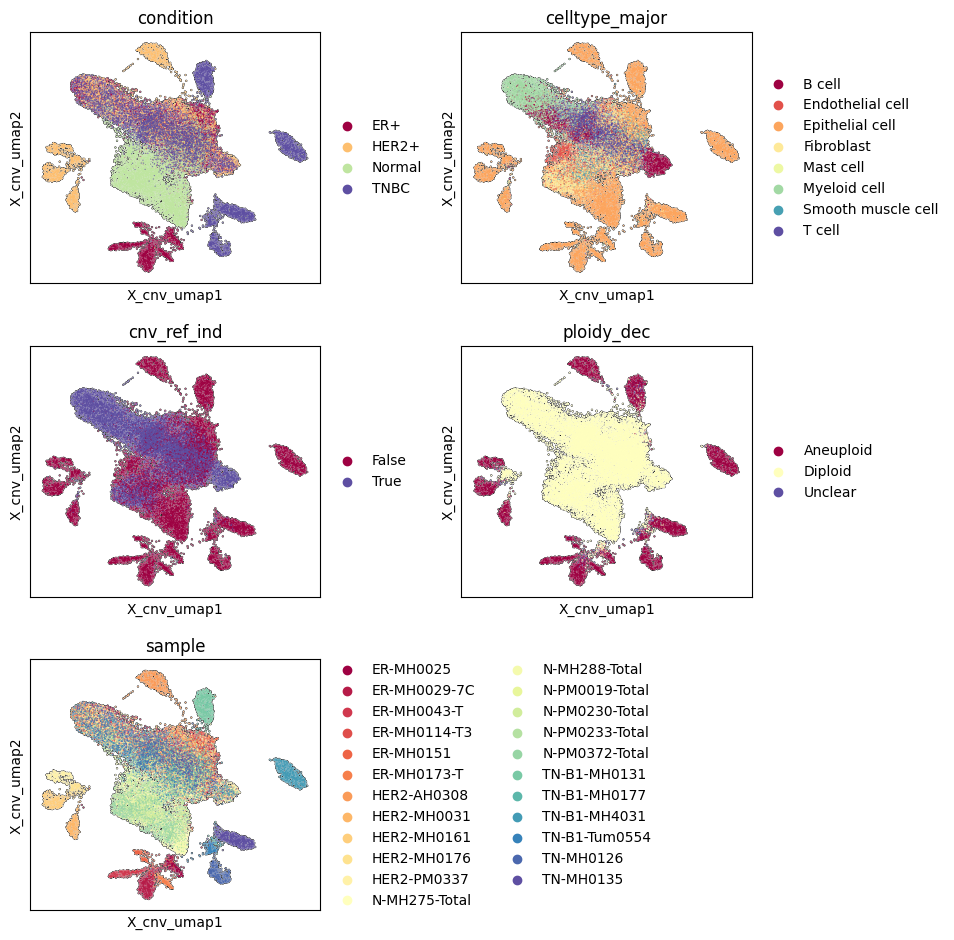

In [ ]:
items_to_plot = ['condition', 'celltype_major', 'cnv_ref_ind', 'ploidy_dec', 'sample']

adata.obs['cnv_ref_ind'] = adata.obs['cnv_ref_ind'].astype(str)
adata.obs['tumor_origin_ind'] = adata.obs['tumor_origin_ind'].astype(str)

plt.rcParams['figure.figsize'] = (3.5, 3.5)
fig = sc.pl.embedding( adata, basis = 'X_cnv_umap', neighbors_key = 'cnv_neighbors',
                       color=items_to_plot, wspace = 0.35, legend_fontsize = 10,
                       ncols = 2, palette = 'Spectral', return_fig = False,
                       add_outline = True)

### __B.5  Inspecting aneuploid/diploid cell population__

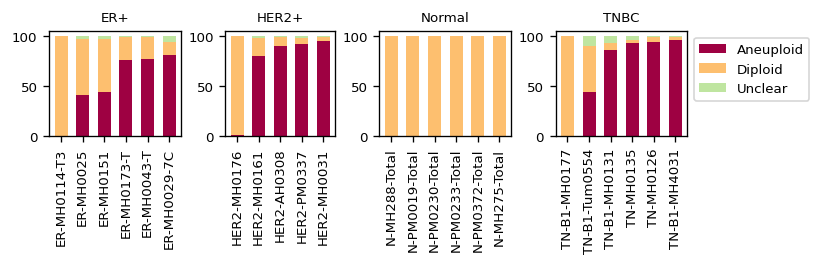

In [ ]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
b = adata_t.obs['tumor_origin_ind']
adata_s = adata_t[b,:]

## 샘플별 세포 개수 확인
sg_map = get_sample_to_group_map(adata_s.obs['sample'], adata_s.obs['condition'])

col = 'ploidy_dec'
df_cnt, df_pct= get_population( adata_s.obs['sample'],
                                adata_s.obs[col], sort_by = [] )

plot_population_grouped( df_pct, sg_map, sort_by = ['Aneuploid'], bar_width = 0.6,
                 title = None, title_fs = 10, title_y_pos = 1.15, dpi = 120,
                 label_fs = 9, tick_fs = 8, xtick_rot = 90, xtick_ha = 'center',
                 legend_fs = 8, legend_loc = 'upper left', bbox_to_anchor = (1,1),
                 legend_ncol = 1, cmap = None, figsize=(6, 1), wspace = 0.35)


### __C. Cell-cell interaction analysis results__
- 샘플별 CCI 결과와 조건별 CCI 결과가 따로 저장되어 있음
- 데이터 포맷은 두 결과가 동일함
- 조건별 CCI는 해당 조건에 포함된 샘플중 일정 퍼센트 이상의 샘플에서 공통적으로 확인된 것들만 추린 것임.
- __CellPhoneDB:__ https://www.cellphonedb.org/

#### __C.1 Structure and format of the cell–cell interaction results__

<div>
<img src="https://drive.google.com/uc?export=view&id=1091cGa6DqKSybzWSd6YE7amC2HDqNIn6" align="center" width="320"/>
</div>

<div>
<img src=attachment:48abf5fd-8f00-4f14-9a91-bb5b872d7275.png width="320"/>   
</div>

In [ ]:
## 샘플 별 CCI 결과
cci_df_dct = adata_t.uns['CCI_sample']
sample_lst = list(cci_df_dct.keys())
sample_lst

In [ ]:
## CCI results in a data frame
cci_df_dct[sample_lst[-1]].tail()

In [ ]:
## Condition 별 CCI 결과
cci_df_dct_per_cond = adata_t.uns['CCI']
cond_lst = list(cci_df_dct_per_cond.keys())
cond_lst

['ER+', 'HER2+', 'Normal', 'TNBC']

#### __C.2 Inspecting condition-specific CCIs__

In [ ]:
cci_df_dct_per_cond = adata_t.uns['CCI']

In [ ]:
adata_t.obs['celltype_for_cci'].unique().tolist()

['Macrophage',
 'Aneuploid Epithelial cell',
 'Diploid Epithelial cell',
 'Mast cell',
 'Fibroblast',
 'B cell',
 'Smooth muscle cell',
 'Endothelial cell',
 'T cell CD4+',
 'Dendritic cell',
 'T cell CD8+',
 'Plasma cell',
 'ILC',
 'unassigned',
 'NK cell']

9 cell_pairs, 61 gene_pairs found


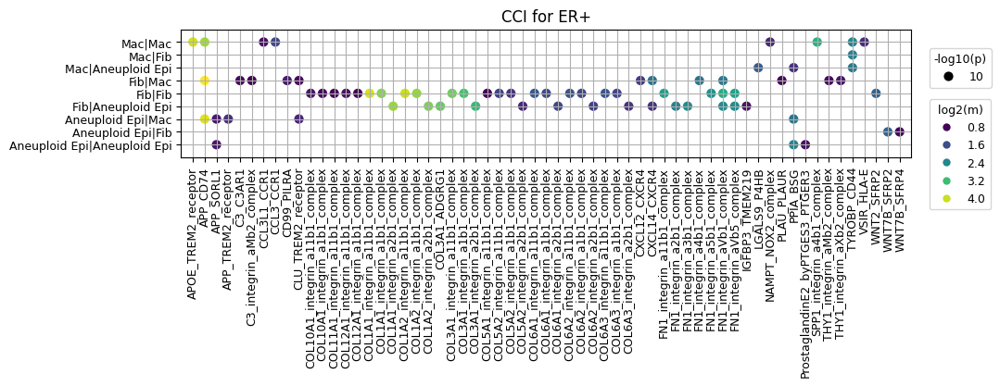

7 cell_pairs, 61 gene_pairs found


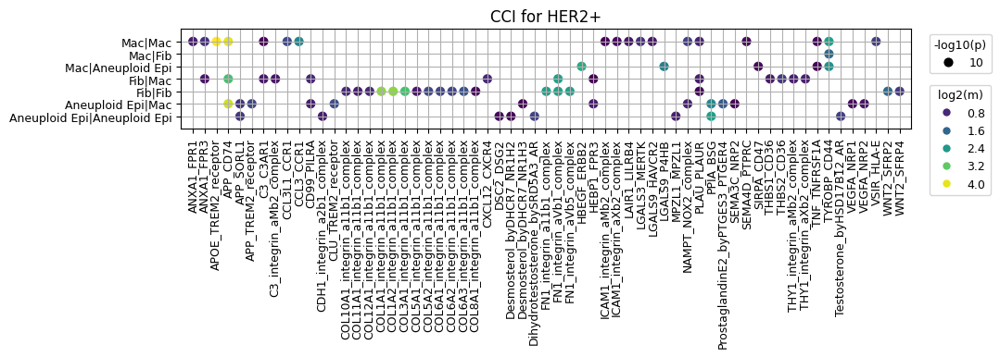

4 cell_pairs, 28 gene_pairs found


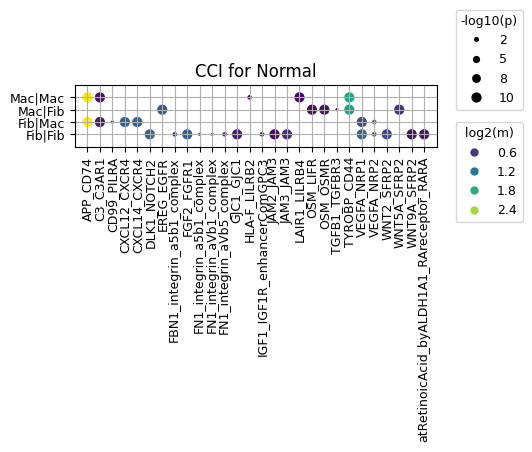

9 cell_pairs, 61 gene_pairs found


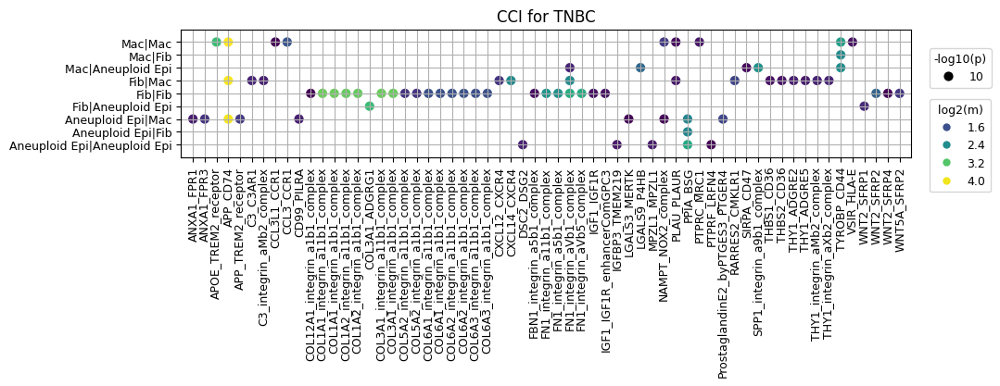

In [ ]:
## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Aneuploid Epithelial cell', 'Macrophage', 'Fibroblast']
target_genes = []

ax = plot_cci_dot( cci_df_dct_per_cond, n_gene_pairs = 60,
                   target_cells = target_cells, target_genes = target_genes,
                   pval_cutoff = 0.1, mean_cutoff = 0.1,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None, title_fs = 12,
                   legend_fs = 9, legend_mkr_sz = 9,
                   tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
                   dpi = 100, swap_ax = True, cmap = None )

### __C.3 Exploring CCis associated with a specific gene set__  

In [ ]:
b1 = adata_t.var_names.str.startswith('CCL')
b2 = adata_t.var_names.str.startswith('CXCL')
b3 = adata_t.var_names.str.startswith('IL')

genes_sel = list(adata_t.var.index.values[b1 | b2 | b3])
np.array(genes_sel)

array(['IL22RA1', 'IL23R', 'IL12RB2', 'ILF2', 'IL6R-AS1', 'IL6R', 'ILDR2',
       'IL10', 'IL19', 'IL20', 'IL24', 'IL1R2', 'IL1R1', 'IL1RL2',
       'IL1RL1', 'IL18R1', 'IL18RAP', 'IL1A', 'IL1B', 'IL36G', 'IL36RN',
       'IL1RN', 'CCL20', 'ILKAP', 'IL5RA', 'IL17RE', 'IL17RC', 'IL17RB',
       'IL17RD', 'ILDR1', 'IL20RB', 'IL12A-AS1', 'IL12A', 'IL1RAP',
       'CXCL8', 'CXCL6', 'CXCL1', 'CXCL5', 'CXCL3', 'CXCL2', 'CXCL9',
       'CXCL10', 'CXCL11', 'CXCL13', 'IL2', 'IL21', 'IL15', 'IL7R',
       'CCL28', 'IL31RA', 'IL6ST', 'IL13', 'CXCL14', 'IL17B', 'IL12B',
       'IL17A', 'IL20RA', 'IL22RA2', 'IL6', 'CCL26', 'IL3RA', 'IL1RAPL1',
       'IL2RG', 'IL1RAPL2', 'IL13RA2', 'IL13RA1', 'IL9R', 'IL7', 'IL33',
       'IL11RA', 'CCL27', 'CCL19', 'CCL21', 'ILK', 'IL18BP', 'IL18',
       'IL10RA', 'IL15RA', 'IL2RA', 'CXCL12', 'IL23A', 'IL26', 'IL17D',
       'IL16', 'IL32', 'IL4R', 'IL21R', 'IL21R-AS1', 'IL27', 'CCL22',
       'CCL17', 'IL34', 'IL17C', 'CXCL16', 'CCL2', 'CCL7', 'CCL11',
       'C

10 cell_pairs, 7 gene_pairs found


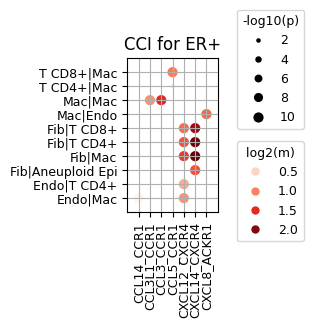

4 cell_pairs, 4 gene_pairs found


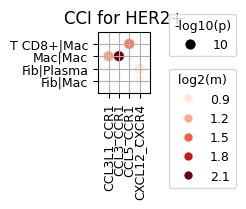

18 cell_pairs, 8 gene_pairs found


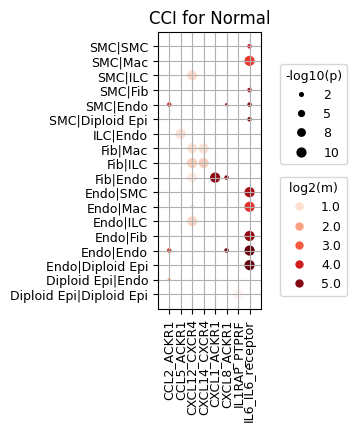

11 cell_pairs, 10 gene_pairs found


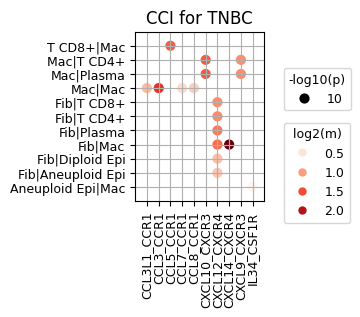

In [ ]:
## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = []
target_genes = genes_sel

ax = plot_cci_dot( cci_df_dct_per_cond, n_gene_pairs = 60,
                   target_cells = target_cells, target_genes = target_genes,
                   pval_cutoff = 0.1, mean_cutoff = 0.1,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None, title_fs = 12,
                   legend_fs = 9, legend_mkr_sz = 9,
                   tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
                   dpi = 100, swap_ax = True, cmap = 'Reds')

### __C.4 Inspecting per-sample CCIs__

In [ ]:
cci_df_dct = adata_t.uns['CCI_sample']

## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Aneuploid Epithelial cell', 'Macrophage', 'Fibroblast']
target_genes = []

ax = plot_cci_dot( cci_df_dct, n_gene_pairs = 60,
                   target_cells = target_cells, target_genes = target_genes,
                   pval_cutoff = 0.1, mean_cutoff = 0.1,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None, title_fs = 12,
                   legend_fs = 9, legend_mkr_sz = 9,
                   tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
                   dpi = 100, swap_ax = True, cmap = None )

#### __C.5 Statistical test for condition-specific differences in CCI strength__
샘플별 CCI 결과에서 모든 샘플에서 공통적으로 확인된 CCI를 골라서 \
각 조건별로 상호작용의 강도간 유의한 차이가 있는지 확인할 수 있음

In [ ]:
cci_df_dct = adata_t.uns['CCI_sample']
target_cells = ['Aneuploid Epithelial cell', 'Macrophage', 'Fibroblast']
target_genes = []

## mean 값을 가져오된 pval가 cutoff 보다 작은 것들만 가져옴
df = get_cci_means( cci_df_dct, cci_idx_lst = None,
                    cells = target_cells, genes = target_genes, pval_cutoff = 0.1 )
## cci_idx_lst를 None으로 설정하면 cci_df_dct에 있는 모든 CCI들의 union에 대한 결과를 리턴함 (pval_cutoff은 적용됨)
## 리턴 결과가 0인 것은 해당 샘플에서 해당 CCI가 검출되지 않은 것임.

df_res = test_group_diff( df, sample_group_map, ref_group = None, pval_cutoff = 0.05 )
df_res

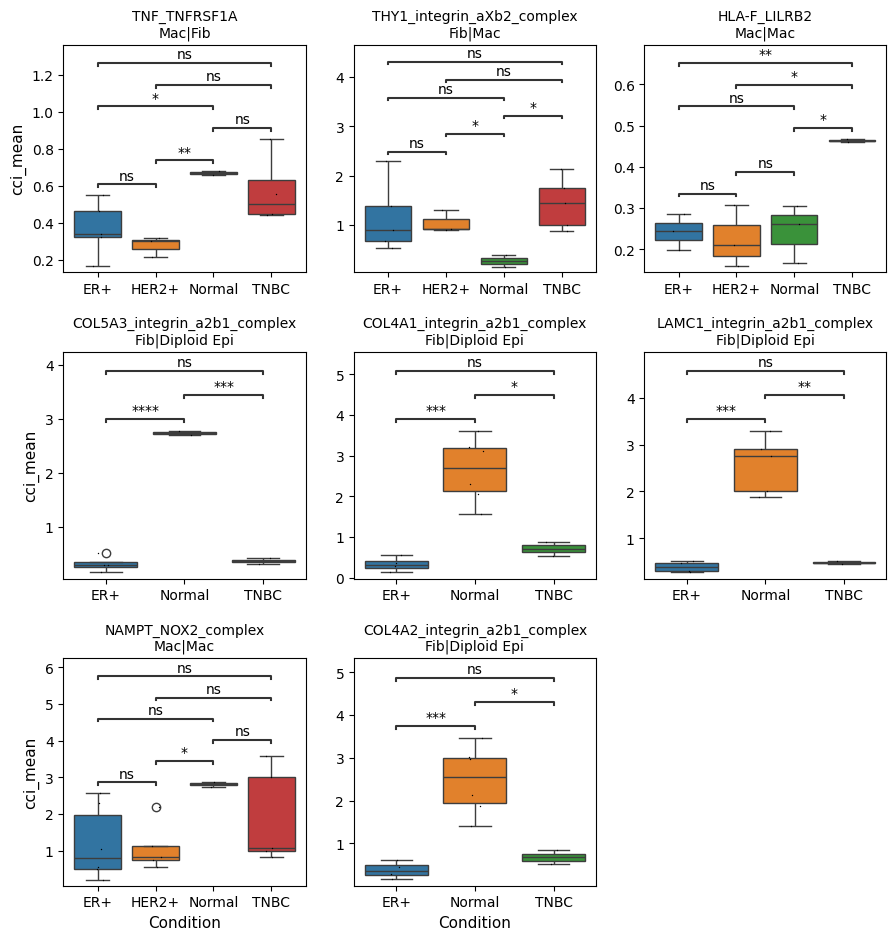

In [ ]:
## 요부분은 sample 별 CCI의 mean이(CCI의 강도가) 조건별로 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커지고요. (p-value가 작아지고요)

## 표시할 결과 항목을 선택: 앞에서 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    df_sel = df[idx_sel].copy(deep = True)

    plot_pct_box(df_sel, sample_group_map, ylabel = 'cci_mean',
              ncols = 3, figsize = (3,3), dpi = 100, rename_cells = rename_dict['celltype_minor'],
              title = None, title_y_pos = 1.05, title_fs = 12,
              label_fs = 11, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
              annot_ref = None, annot_fmt = 'star', annot_fs = 10,
              ws_hs = (0.2, 0.35), stripplot = True)

#### __C.6 Statistical test for condition-specific differences in CCI strength (specifying genes to consider)__
샘플별 CCI 결과에서 여러 샘플에서 공통적으로 확인된 CCI를 골라서 \
각 조건별로 상호작용의 강도간 유의한 차이가 있는지 확인할 수 있음

In [ ]:
cci_df_dct = adata_t.uns['CCI_sample']
target_cells = ['Aneuploid Epithelial cell', 'Macrophage', 'Fibroblast']
target_genes = ['DSC2', 'ERBB2', 'ESR1']

## mean 값을 가져오된 pval가 cutoff 보다 작은 것들만 가져옴
df = get_cci_means( cci_df_dct, cci_idx_lst = None,
                    cells = target_cells, genes = target_genes, pval_cutoff = 0.2 )
## cci_idx_lst를 None으로 설정하면 cci_df_dct에 있는 모든 CCI들의 union에 대한 결과를 리턴함 (pval_cutoff은 적용됨)
## 리턴 결과가 0인 것은 해당 샘플에서 해당 CCI가 검출되지 않은 것임.

df_res = test_group_diff( df, sample_group_map, ref_group = None, pval_cutoff = 0.5 )
df_res

,HER2+_vs_ER+,Normal_vs_ER+,Normal_vs_HER2+,TNBC_vs_ER+,TNBC_vs_HER2+,TNBC_vs_Normal
DSC2_DSG2--Aneuploid Epithelial cell|Aneuploid Epithelial cell,0.416278,1.00000,1.0,0.132896,0.167298,1.0
HBEGF_ERBB2--Macrophage|Aneuploid Epithelial cell,0.125932,1.00000,1.0,0.682878,0.121943,1.0
DSC2_DSG2--Macrophage|Diploid Epithelial cell,1.000000,0.13004,1.0,1.000000,1.000000,1.0
HBEGF_ERBB2--Macrophage|Diploid Epithelial cell,1.000000,1.00000,1.0,0.316339,1.000000,1.0


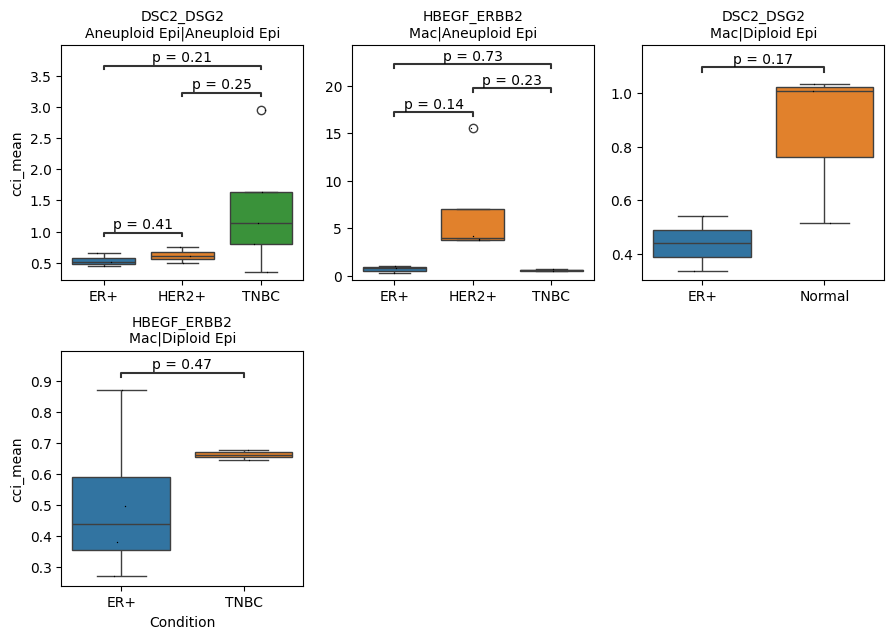

In [ ]:
## 요부분은 sample 별 CCI의 mean이(CCI의 강도가) 조건별로 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커지고요. (p-value가 작아지고요)

## 표시할 결과 항목을 선택: 앞에서 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]


if len(idx_sel) > 0:
    df_sel = df[idx_sel].copy(deep = True)

    ## Show the selected CCIs
    plot_pct_box(df_sel, sample_group_map, ylabel = 'cci_mean',
              ncols = 3, figsize = (3,3), dpi = 100, rename_cells = rename_dict['celltype_minor'],
              title = None, title_y_pos = 1.05, title_fs = 12,
              label_fs = 10, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
              annot_ref = None, annot_fmt = 'simple', annot_fs = 10,
              ws_hs = (0.2, 0.3), stripplot = True)

#### __C.7 Circle plots for an overview of cell-cell interactions__

In [ ]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
cci_df_dct = adata_t.uns['CCI_sample']

plot_cci_circ_group( cci_df_dct, target = None,
                     rename_cells = rename_dict['celltype_minor'],
                     remove_common = False, ncol = 4, figsize = (3.5,3.5),
                     title = None, title_y_pos = 1.1, title_fs = 24,
                     text_fs = 9, num_fs = 7, margin = 0.08,
                     dpi = 100, alpha = 0.5, R_curvature = 3,
                     linewidth_max = 8, linewidth_log = False,
                     node_size = 8, rot = False, cmap = 'Spectral',
                     wspace = 0.15, hspace = 0.1 )

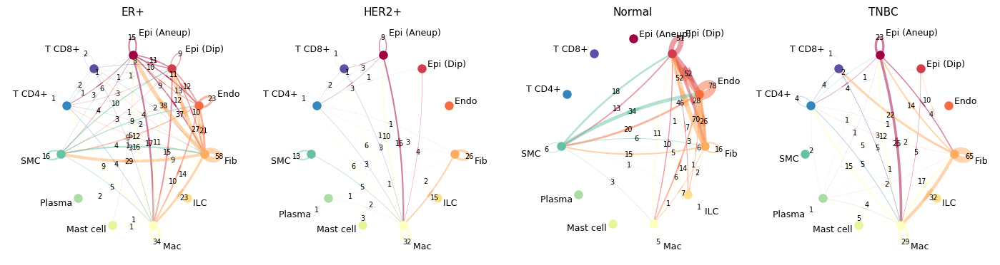

In [ ]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
cci_df_dct = adata_t.uns['CCI']

plot_cci_circ_group( cci_df_dct, target = None,
                     rename_cells = rename_dict['celltype_minor'],
                     remove_common = False, ncol = 4, figsize = (3.5,3.5),
                     title = None, title_y_pos = 1.1, title_fs = 24,
                     text_fs = 9, num_fs = 7, margin = 0.08,
                     dpi = 100, alpha = 0.5, R_curvature = 3,
                     linewidth_max = 8, linewidth_log = False,
                     node_size = 8, rot = False, cmap = 'Spectral',
                     wspace = 0.25, hspace = 0.1 )

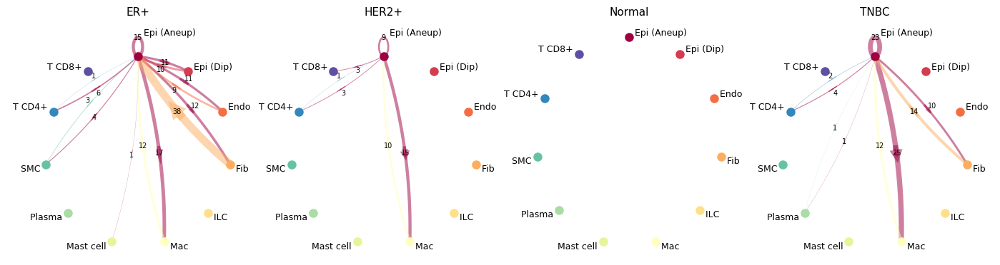

In [ ]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
cci_df_dct = adata_t.uns['CCI']

## 특정 세포유형을 중심으로 CCI 개수 확인 (이 경우 Epithelial cell을 중심으로 봄)
target = ['Epi (Aneup)']

plot_cci_circ_group( cci_df_dct, target = target,
                     rename_cells = rename_dict['celltype_minor'],
                     remove_common = False, ncol = 4, figsize = (3.5,3.5),
                     title = None, title_y_pos = 1.1, title_fs = 24,
                     text_fs = 9, num_fs = 7, margin = 0.08,
                     dpi = 100, alpha = 0.5, R_curvature = 3,
                     linewidth_max = 8, linewidth_log = False,
                     node_size = 8, rot = False, cmap = 'Spectral',
                     wspace = 0.15, hspace = 0.1 )

### __D. DEG analysis results and marker/target discovery__
- DEG 결과는 각 세포 유형별로 처리되어 저장됨
- major, minor, subset 중 어느 수준을 기준으로 할지는 analysis_parameters에서 정의 할 수 있음
- 현재의 결과는 celltype_minor 기준으로 세포 유형별로 condition-specific DEG를 얻은 결과 임.

In [ ]:
adata_t

AnnData object with n_obs × n_vars = 33742 × 22585
    obs: 'Patient', 'Description', 'Source', 'Condition', 'Menopause', 'Parity', 'Gender', 'geo_no', 'sid', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'subtype', 'subtype_detail', 'tissue', 'condition', 'sample', 'copykat_dec', 'scevan_dec', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'ploidy_init_group', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind'
    var: 'variable_genes', 'chr', 'spot_no'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_neighbors_info', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'X_pca', 'i

In [ ]:
nc_deg_dct_of_dct = adata_t.uns['DEG_stat'] ## DEG 분석에 사용된 셀수 정보
df_deg_dct_of_dct = adata_t.uns['DEG'] ## DEG 분석 결과

## 어떤 세포 유형들에 대한 DEG 결과가 있는지 확인
list(df_deg_dct_of_dct.keys())

## analysis_parameters에 정의한 DEG분석을 위한 최소 셀수(MIN_NUM_CELLS_FOR_DEG)보다
## 적은 셀수를 갖는 세포 유형에 대해서는 DEG 분석이 수행 되지 않음.
## (각 조건 별로 해당 유형의 셀수가 최소한 MIN_NUM_CELLS_FOR_DEG 정도되어야 DEG 분석이 수행됨)

['Aneuploid Epithelial cell',
 'B cell',
 'Diploid Epithelial cell',
 'Endothelial cell',
 'Epithelial cell',
 'Fibroblast',
 'ILC',
 'Macrophage',
 'Mast cell',
 'Plasma cell',
 'Smooth muscle cell',
 'T cell CD4+',
 'T cell CD8+']

#### __D.1 Structure and format of the DEG results__

##### __DEG 결과 데이터의 구성__

<div>
<img src="https://drive.google.com/uc?export=view&id=1N-XeRpAvUAlnuryLpll7sYyzGbKGK5eG" align="center" width="500"/>
</div>

<div>
<img src=attachment:f57fafbd-8253-4210-88ed-9acbc3224d08.png width="500"/>   
</div>

In [ ]:
## 특정 세포 유형에 대한 DEG 분석 결과를 가져옴 (이경우 Epithelial cell)
target_cell = 'Epithelial cell'

df_deg_dct = df_deg_dct_of_dct[target_cell]
nc_deg_dct = nc_deg_dct_of_dct[target_cell]

## 해당 세포 유형에 사용된 조건 별 셀수 확인
nc_deg_dct

{'Diploid_vs_others': {'Diploid': 1822, 'others': 3913},
 'ER+_vs_others': {'ER+': 954, 'others': 4781},
 'HER2+_vs_others': {'HER2+': 803, 'others': 4932},
 'Normal_vs_others': {'Normal': 1200, 'others': 4535},
 'TNBC_vs_others': {'TNBC': 956, 'others': 4779}}

In [ ]:
df_deg_dct['HER2+_vs_others'].head()

,log2_FC,pval,pval_adj,mean_test,mean_ref,nz_pct_test,nz_pct_ref,nz_pct_score,gene,Rp
GRB7,3.312,1.172881e-136,1.194227e-132,1.658931,0.356504,0.780822,0.284167,0.558938,GRB7,1.0
ERBB2,4.407,1.787491e-259,1.820023e-255,3.326869,0.817723,0.947696,0.457023,0.514577,ERBB2,1.0
PGAP3,2.852,6.001492e-79,6.110719e-75,0.818670,0.161722,0.572852,0.103774,0.513405,PGAP3,1.0
MED1,2.988,5.813113e-82,6.290950e-78,1.095628,0.223945,0.579078,0.226667,0.447821,MED1,1.0
CDK12,2.620,1.644403e-85,1.779573e-81,1.411648,0.408568,0.683686,0.350000,0.444396,CDK12,1.0


- nz_pct_score = nz_pct_test*(1-nz_pct_ref)
- nz_pct_test: percentage of cells with the gene expressed in test group
- nz_pct_ref: percentage of cells with the gene expressed in reference group

#### __D.2 Gene ranking per celltype__

Epithelial cell


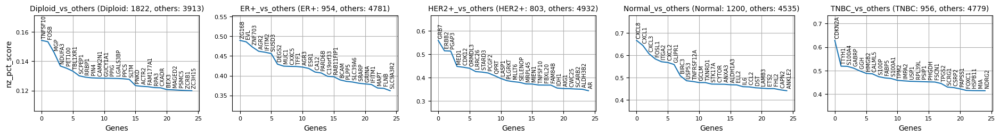

In [ ]:
key = 'Epithelial cell'
df_deg_dct = df_deg_dct_of_dct[key]
nc_deg_dct = nc_deg_dct_of_dct[key]

n_genes_to_show = 25

print(key)
plot_deg( df_deg_dct, deg_stat_dct = nc_deg_dct, reference = 'nz_pct_score',
          n_genes_to_show = n_genes_to_show, pval_cutoff = 0.01,
          figsize = (4,2), dpi = 100, text_fs = 7, title_fs = 10, label_fs = 10,
          tick_fs = 8, ncols = 5, wspace = 0.2, hspace = 0.5,
          show_log_pv = False )


In [ ]:
n_genes_to_show = 25

for key in df_deg_dct_of_dct.keys():
    df_deg_dct = df_deg_dct_of_dct[key]
    nc_deg_dct = nc_deg_dct_of_dct[key]

    print(key)
    plot_deg( df_deg_dct, deg_stat_dct = nc_deg_dct, reference = 'nz_pct_score',
              n_genes_to_show = n_genes_to_show, pval_cutoff = 0.01,
              figsize = (4,2), dpi = 100, text_fs = 7, title_fs = 10, label_fs = 10,
              tick_fs = 8, ncols = 5, wspace = 0.2, hspace = 0.5,
              show_log_pv = False )


#### __D.3 Discovery of condition-specific markers (per-celltype)__

In [ ]:
adata_t

AnnData object with n_obs × n_vars = 33742 × 22585
    obs: 'Patient', 'Description', 'Source', 'Condition', 'Menopause', 'Parity', 'Gender', 'geo_no', 'sid', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'subtype', 'subtype_detail', 'tissue', 'condition', 'sample', 'copykat_dec', 'scevan_dec', 'sample_ext', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'ploidy_init_group', 'condition_for_deg', 'sample_ext_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind'
    var: 'variable_genes', 'chr', 'spot_no'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'DEG_vs_ref', 'DEG_vs_ref_stat', 'GSA_down', 'GSA_up', 'GSA_vs_ref_down', 'GSA_vs_ref_up', 'GSEA', 'GSEA_vs_ref', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_neighbors_info', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'X_pca', 'i

In [ ]:
nc_deg_dct_of_dct = adata_t.uns['DEG_stat']
df_deg_dct_of_dct = adata_t.uns['DEG']
df_deg_dct_of_dct.keys()

dict_keys(['Aneuploid Epithelial cell', 'B cell', 'Diploid Epithelial cell', 'Endothelial cell', 'Epithelial cell', 'Fibroblast', 'ILC', 'Macrophage', 'Mast cell', 'Plasma cell', 'Smooth muscle cell', 'T cell CD4+', 'T cell CD8+'])

In [ ]:
# target_cell = 'Fibroblast'
# target_cell = 'Macrophage'
# target_cell = 'Ductal cell'
target_cell = 'Epithelial cell'

df_deg_lst = df_deg_dct_of_dct[target_cell]

mkr_dict, df_deg_dct_updated = find_condition_specific_markers( df_deg_lst,
                                            score_col = 'nz_pct_score',
                                            n_markers_max = 40,
                                            score_cutoff = 0.25,
                                            pval_cutoff = 0.05,
                                            nz_pct_fc_cutoff = 1.25,
                                            surfaceome_only = True,
                                            verbose = True )

## Print results
for key in mkr_dict.keys():
    mkr_dict[key].sort()
    print('%s (%i): ' % (key, len(mkr_dict[key])), mkr_dict[key])


N_markers: 
   Diploid_vs_others (8879 -> 0) 
   ER+_vs_others (10250 -> 212) 
   HER2+_vs_others (9982 -> 137) 
   Normal_vs_others (9793 -> 480) 
   TNBC_vs_others (10746 -> 462)
N_markers_selected: Diploid (0), ER+ (40), HER2+ (40), Normal (40), TNBC (40)
Diploid (0):  []
ER+ (40):  ['AGR2', 'AGR3', 'BCAM', 'BST2', 'C19orf33', 'CA12', 'CST6', 'CXXC5', 'CYHR1', 'DEGS2', 'ERLIN2', 'ESR1', 'EVL', 'FLNB', 'GRINA', 'IFI6', 'IFITM1', 'IFITM2', 'IFITM3', 'MAPT', 'MUC1', 'PARD6B', 'PLA2G16', 'PLPP5', 'PRPF6', 'RAB11FIP1', 'RARRES3', 'SLC39A6', 'SLC9A3R2', 'SRARP', 'SREBF1', 'STC2', 'STX16', 'SUSD3', 'TFF1', 'TFF3', 'ZG16B', 'ZNF217', 'ZNF552', 'ZNF703']
HER2+ (40):  ['AIG1', 'ALDH3B2', 'AR', 'CALM3', 'CDK12', 'CLTC', 'CWC25', 'CYB561', 'ERBB2', 'FAM84B', 'FBXL20', 'G6PD', 'GALNT7', 'GPR160', 'GRB2', 'GRB7', 'HMGCS1', 'IDH1', 'LASP1', 'LRRC26', 'MED1', 'MGAT4A', 'MIEN1', 'MLLT6', 'MRPL45', 'MSL1', 'ORMDL3', 'PCBD1', 'PCGF2', 'PGAP3', 'PKIB', 'PLGRKT', 'QPRT', 'SCARB2', 'SELENOP', 'SMARCA2', 

Num markers selected: 120 -> 120


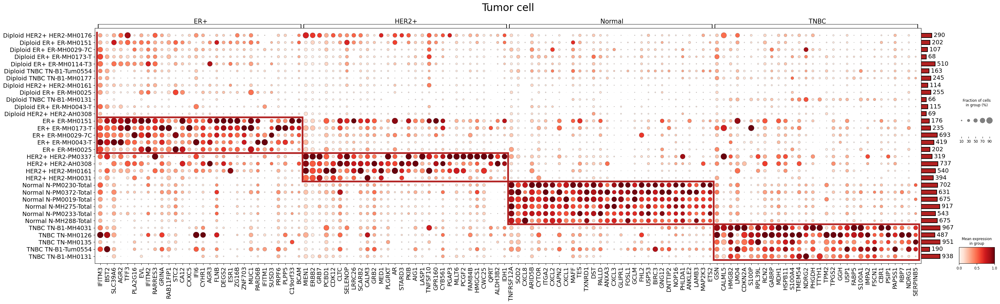

In [ ]:
target_cell = 'Tumor cell'
title = target_cell

plot_marker_exp(adata_t, markers = mkr_dict, celltype_selection = target_cell,
                N_cells_per_group_min = 40, N_markers_per_group_max = 30, N_markers_total = 140,
                title = title, title_y_pos = 2, title_fs = 24, text_fs = 14,
                var_group_height = 1.2, var_group_rotation = 0,
                standard_scale = 'var', nz_frac_max = 0.9, nz_frac_cutoff = 0.05,
                rem_mkrs_common_in_N_groups_or_more = 3, legend = True,
                figsize = None, swap_ax = False, add_rect = True,
                cmap = 'Reds', linewidth = 4, linecolor = 'firebrick' )

#### __D.4 Examining expression patterns of selected markers using violin plots__

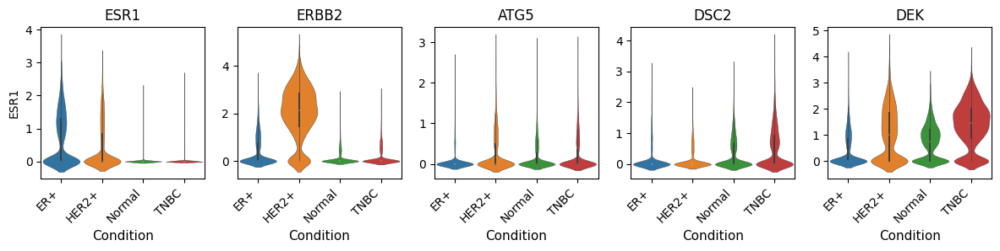

In [ ]:
items_to_plot = ['ESR1', 'ERBB2', 'ATG5', 'DSC2', 'DEK']

b = adata_t.obs['tumor_origin_ind']
adata_s = adata_t[b,:]

## RNA Expression의 log변환 값을 기준으로 violin plot을 확인
sc.pp.normalize_total(adata_s, target_sum=1e4)
sc.pp.log1p(adata_s)

df = adata_s[:, items_to_plot].to_df()
df['group'] = adata_s.obs['condition']

plot_violin( df, genes_lst = items_to_plot, group_col = 'group', scale = 'width',
             group_order = None, inner = 'box', width = 0.9, linewidth = 0.3, bw = 'scott',
             figsize = (2.5,2), dpi = 100,
             text_fs = 10, title = None, title_fs = 14, title_y_pos = 1,
             label_fs = 11, tick_fs = 10, xtick_rot = 45, xtick_ha = 'right',
             ncols = 5, wspace = 0.2, hspace = 0.3, cmap = 'tab10' )

#### __D.5 Statistical test for mean-expression of condition-specific markers__
- 요부분은 sample 별 Gene expression의 평균이 조건별로 유의하게 차이가 나는지 확인하는 부분입니다. (위 코드셀의 결과가 사용됩니다)
- 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고 sample이 많을 수록 통계적 유의성이 커짐. (p-value가 작아짐)

In [ ]:
target_genes = []

df_all = get_gene_expression_mean( adata_s, genes = target_genes, group_col = 'sample_ext' )
df_res = test_group_diff( df_all, sample_group_map,
                          ref_group = None, pval_cutoff = 0.001 )

display(df_res)

,HER2+_vs_ER+,Normal_vs_ER+,Normal_vs_HER2+,TNBC_vs_ER+,TNBC_vs_HER2+,TNBC_vs_Normal
SPDEF,0.125917,9.446154e-04,4.422455e-07,0.000868,6.724578e-07,6.650585e-01
CRYAB,0.092984,1.548416e-05,2.212694e-05,0.000110,1.483427e-04,4.131857e-01
SFRP1,0.078740,4.283105e-05,3.863738e-05,0.000547,4.643140e-04,5.330310e-01
FOXA1,0.181838,6.941696e-04,4.905952e-04,0.000548,6.762987e-04,3.386852e-02
AKAP12,0.237849,4.080792e-08,5.473916e-07,0.548196,2.528359e-01,1.847830e-08
...,...,...,...,...,...,...
UBA7,0.160942,9.373570e-04,5.464255e-01,0.195585,9.657685e-01,5.396590e-01
SCAP,0.270286,3.955397e-04,5.001796e-01,0.505007,8.235390e-01,4.207506e-01
WASF1,0.377094,9.820571e-04,9.697327e-01,0.103534,7.613812e-01,4.388466e-01
TMEM216,0.594061,7.673674e-04,2.975004e-01,0.218440,5.153707e-01,8.758977e-01


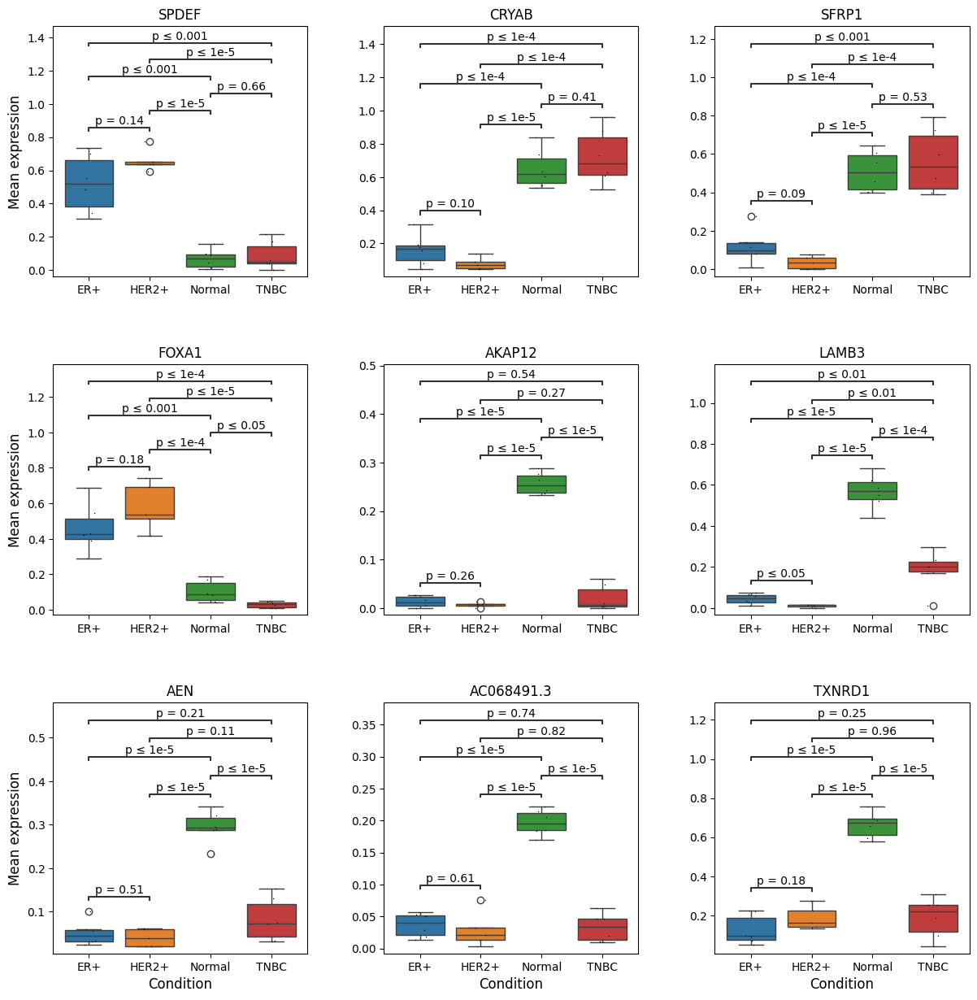

In [ ]:
## Show the first 9 genes
num_items_to_plot = 9
items_to_plot = df_res.iloc[:num_items_to_plot].index.values.tolist()

plot_pct_box( df_all[items_to_plot],
              sample_group_map, ylabel = 'Mean expression',
              ncols = 3, figsize = (4,4), dpi = 100,
              title = None, title_y_pos = 1.05, title_fs = 14,
              label_fs = 12, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
              annot_ref = None, annot_fmt = 'simple', annot_fs = 10,
              ws_hs = (0.3, 0.35), stripplot = True)

#### __D.6 Statistical test for mean-expression of some selected genes__


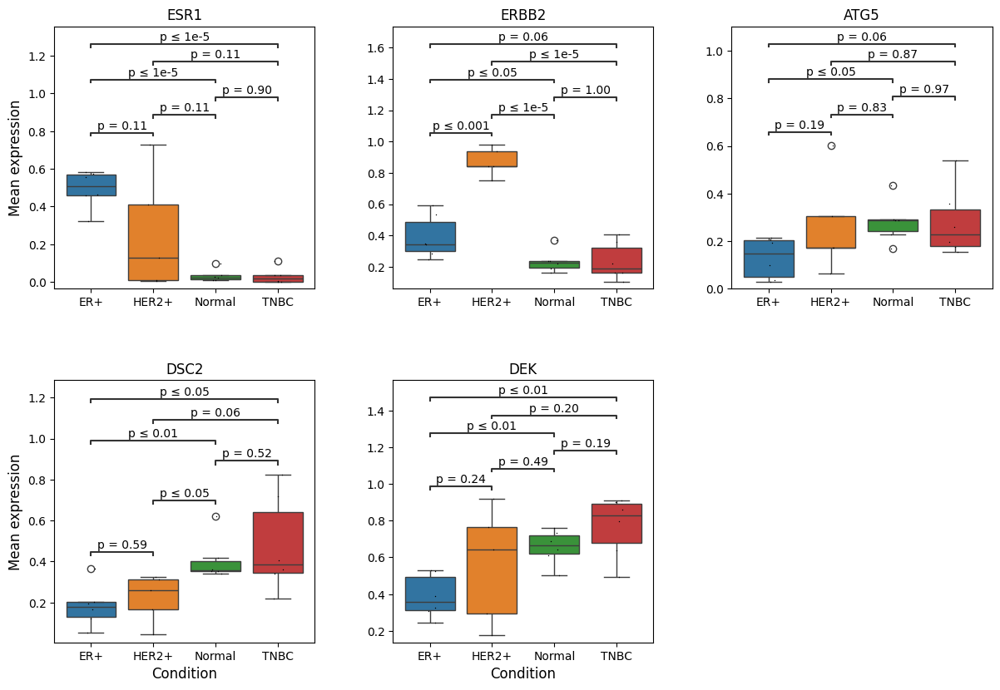

In [ ]:
items_to_plot = ['ESR1', 'ERBB2', 'ATG5', 'DSC2', 'DEK']

plot_pct_box(df_all[items_to_plot],
             sample_group_map, ylabel = 'Mean expression',
             ncols = 3, figsize = (4,4), dpi = 100,
             title = None, title_y_pos = 1.05, title_fs = 14,
             label_fs = 12, tick_fs = 10, xtick_rot = 0, xtick_ha = 'center',
             annot_ref = None, annot_fmt = 'simple', annot_fs = 10,
             ws_hs = (0.3, 0.35), stripplot = True)

### __E. Gene Set Aanalysis results__
#### __E.1 Structure and format of the GSA/GSEA results__

In [ ]:
gsa_res_up = adata_t.uns['GSA_up']
gsa_res_dn = adata_t.uns['GSA_down']

list(gsa_res_up.keys())

['Aneuploid Epithelial cell',
 'B cell',
 'Diploid Epithelial cell',
 'Endothelial cell',
 'Epithelial cell',
 'Fibroblast',
 'ILC',
 'Macrophage',
 'Mast cell',
 'Plasma cell',
 'Smooth muscle cell',
 'T cell CD4+',
 'T cell CD8+']

##### __Structure of the GSA/GSEA results__

<div>
<img src="https://drive.google.com/uc?export=view&id=1RrmkpkWCI1rcfW5cIBfKvip-lX3lkJRL" align="center" width="500"/>
</div>

<div>
<img src=attachment:1369afc9-25a8-4811-bc55-41e7c61309af.png width="500"/>   
</div>

In [ ]:
gsa_res = gsa_res_up
target_cell = 'Epithelial cell'

gsa_keys = list(gsa_res[target_cell].keys())
list(gsa_keys)

['Diploid_vs_others',
 'ER+_vs_others',
 'HER2+_vs_others',
 'Normal_vs_others',
 'TNBC_vs_others']

##### __Format of a GSA result__

In [ ]:
gsa_res[target_cell][gsa_keys[2]].head()

#### __E.2 Barplot visualization of condition-specific pathways activity__

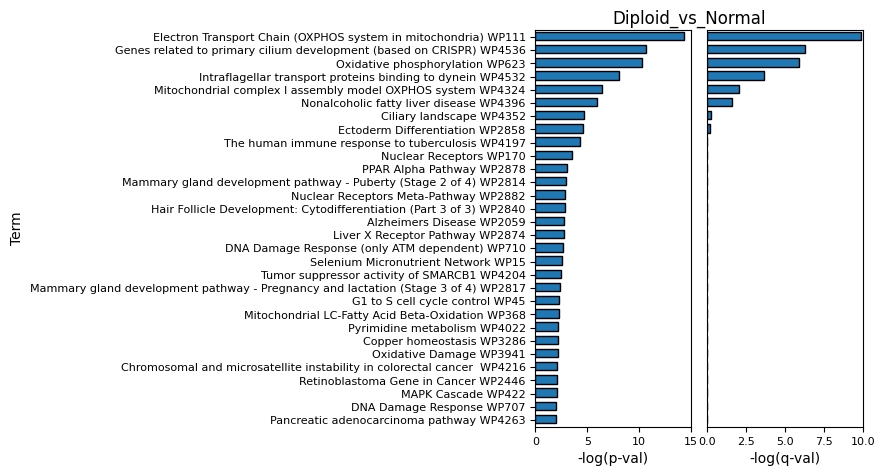

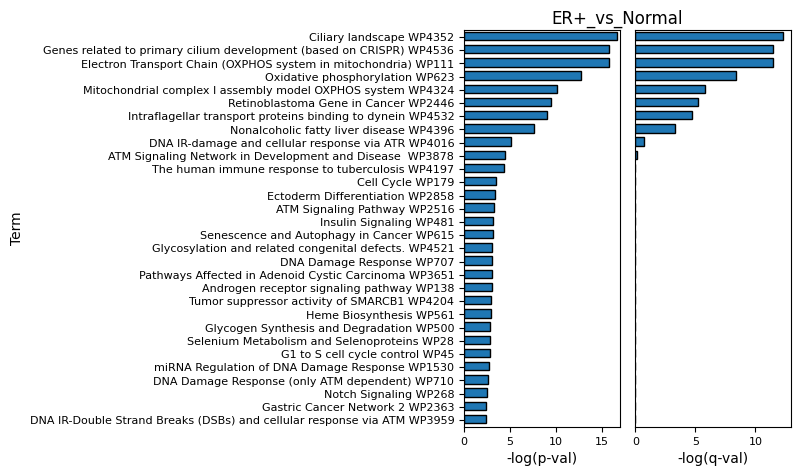

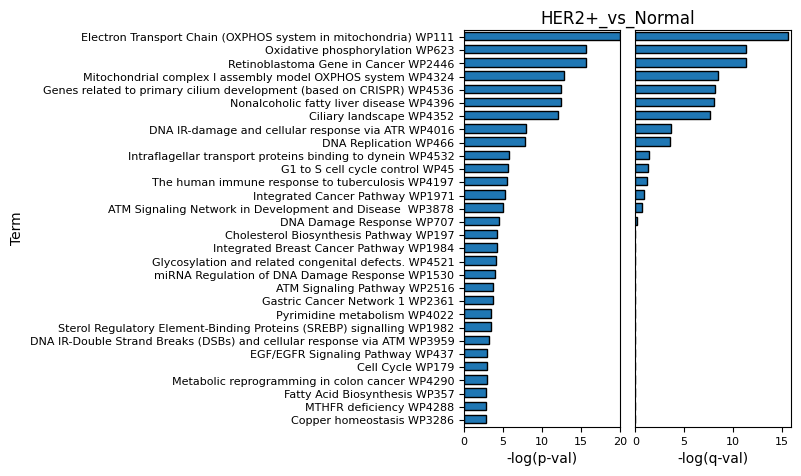

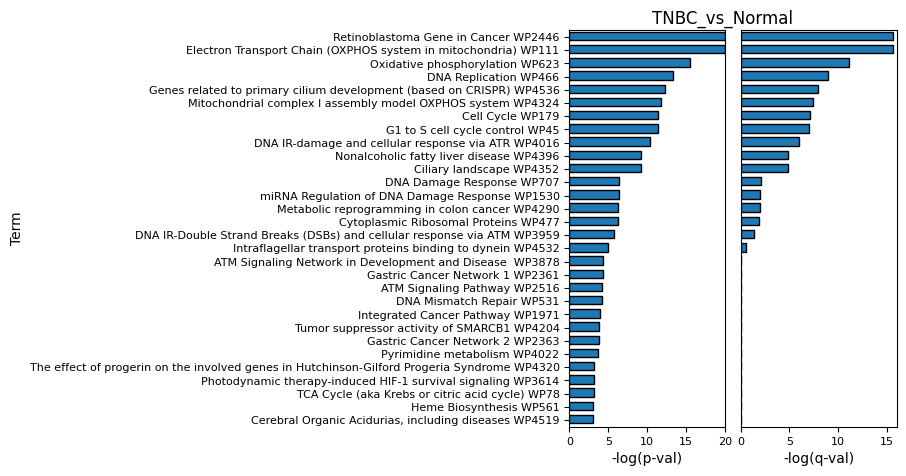

In [ ]:
target_cell = 'Epithelial cell'
# target_cell = 'Aneuploid Epithelial cell'
df_gsa_dct = gsa_res[target_cell]

df_sel_dct = plot_gsa_bar( df_gsa_dct, pval_cutoff = 1e-2, N_max_to_show = 30,
                           title = None, bar_width = 0.8,
                           title_pos = (0.5, 1), title_fs = 12, title_ha = 'center',
                           label_fs = 10, tick_fs = 8, wspace=0.1, hspace=0.25, Ax = None,
                           facecolor = 'tab:blue', edgecolor = 'black' )

#### __E.3 Dotplot visualization for an overview of condition-specific pathways activity__

In [ ]:
gsa_res = adata_t.uns['GSA_vs_ref_up']
gsa_res.keys()

dict_keys(['Diploid Epithelial cell', 'Endothelial cell', 'Epithelial cell', 'Fibroblast', 'ILC', 'Macrophage', 'Smooth muscle cell'])

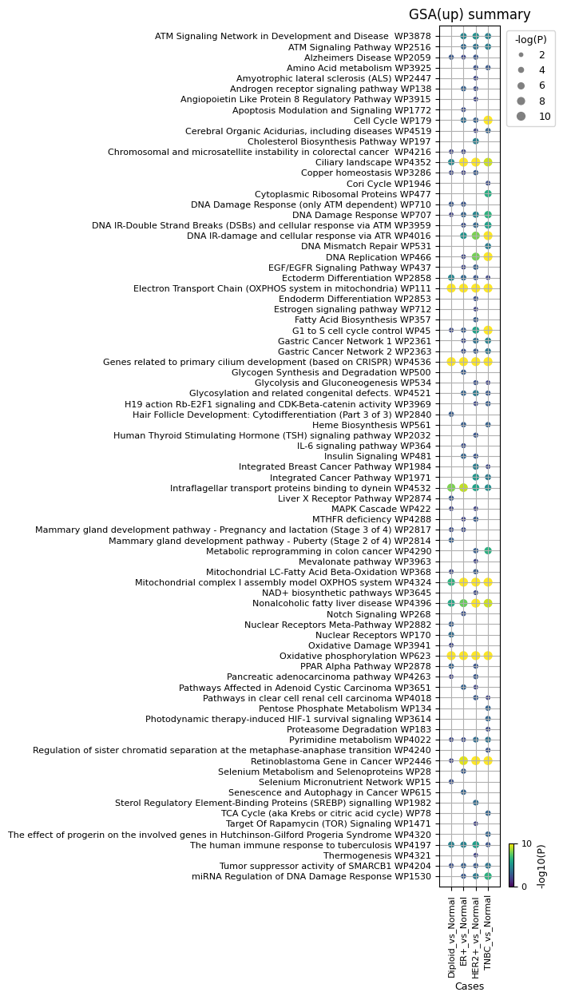

In [ ]:
key = 'Epithelial cell'
gsa_res_t = gsa_res[key]

plot_gsa_dot( gsa_res_t, pval_cutoff = 1e-2, title = 'GSA(up) summary', title_fs = 12,
              tick_fs = 8, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 9, legend_fs = 9, swap_ax = False, figsize = (1.2,14),
              dpi = 100, dot_size = 50, cbar_frac = 0.1, cbar_aspect = 10, cmap = 'viridis' )

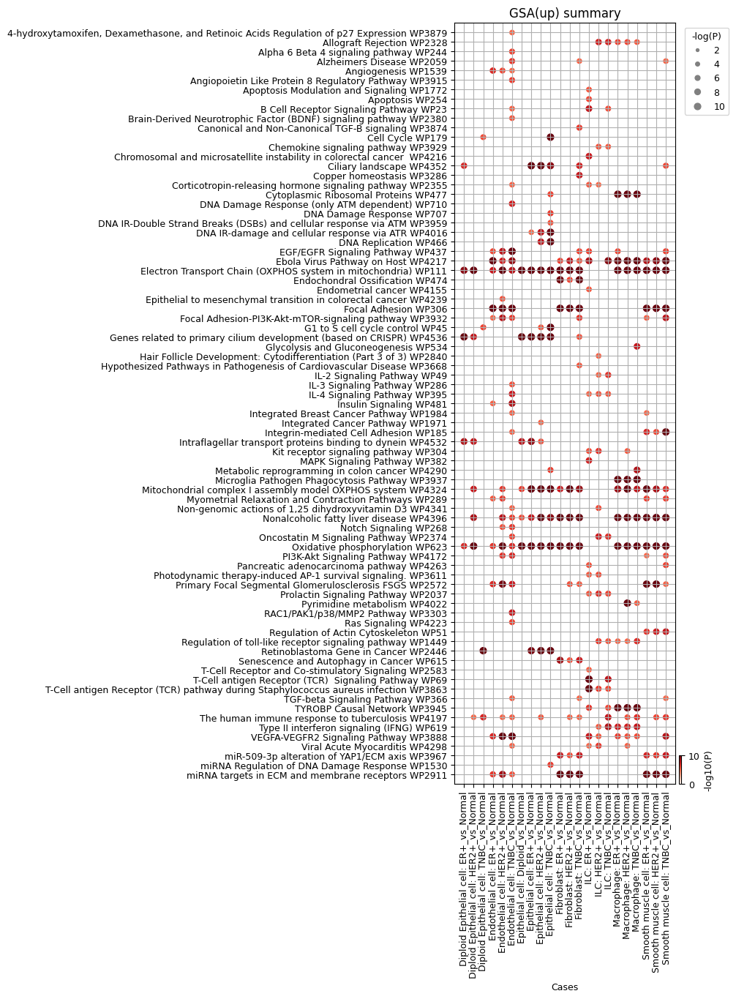

In [ ]:
plot_gsa_dot( gsa_res, pval_cutoff = 1e-5, title = 'GSA(up) summary',
              title_fs = 12, tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 9, legend_fs = 9, swap_ax = False, figsize = None,
              dpi = 100, dot_size = 40, cbar_frac = 0.05, cbar_aspect = 15,
              cmap = 'Reds' )

### __F. GSEA results__
#### Data structure and format are the same as those for GSA results

In [ ]:
gsea_res = adata_t.uns['GSEA']
list(gsea_res.keys())

['Aneuploid Epithelial cell',
 'B cell',
 'Diploid Epithelial cell',
 'Endothelial cell',
 'Epithelial cell',
 'Fibroblast',
 'ILC',
 'Macrophage',
 'Mast cell',
 'Plasma cell',
 'Smooth muscle cell',
 'T cell CD4+',
 'T cell CD8+']

In [ ]:
target_cell = 'Epithelial cell'

gsea_keys = list(gsea_res[target_cell].keys())
list(gsea_keys)

['Diploid_vs_others',
 'ER+_vs_others',
 'HER2+_vs_others',
 'Normal_vs_others',
 'TNBC_vs_others']

#### __F.1 Barplot visualization of condition-specific pathways activity__

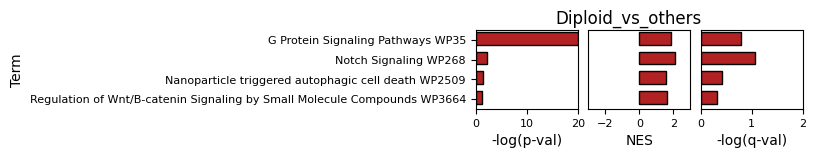

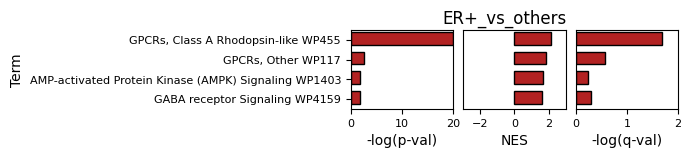

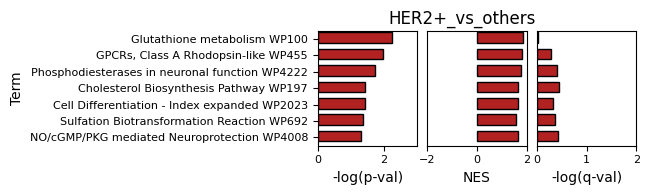

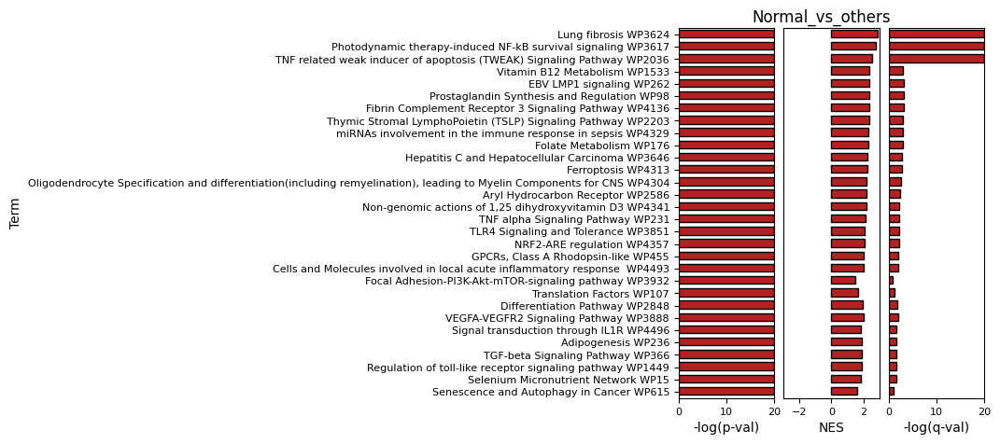

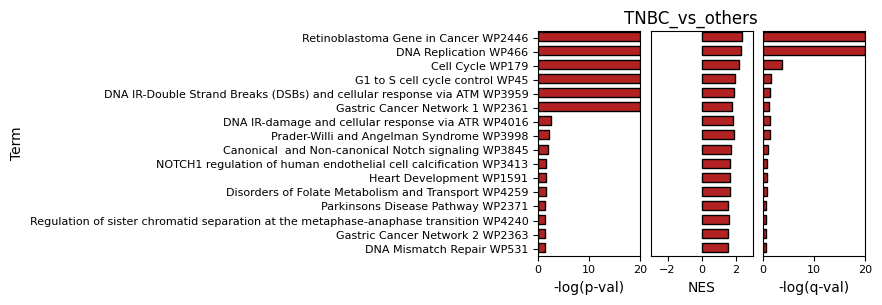

In [ ]:
target_cell = 'Epithelial cell'
# target_cell = 'Aneuploid Epithelial cell'
df_gsea_dct = gsea_res[target_cell]

df_sel_dct = plot_gsa_bar( df_gsea_dct, pval_cutoff = 1e-1,
                           nes_cutoff = 0, N_max_to_show = 30,
                           title = None, bar_width = 0.8,
                           title_pos = (0.5, 1), title_fs = 12, title_ha = 'center',
                           label_fs = 10, tick_fs = 8, wspace=0.1, hspace=0.25, Ax = None,
                           facecolor = 'firebrick', edgecolor = 'black' )

#### __F.2 Dotplot visualization for an overview of condition-specific pathways activity__

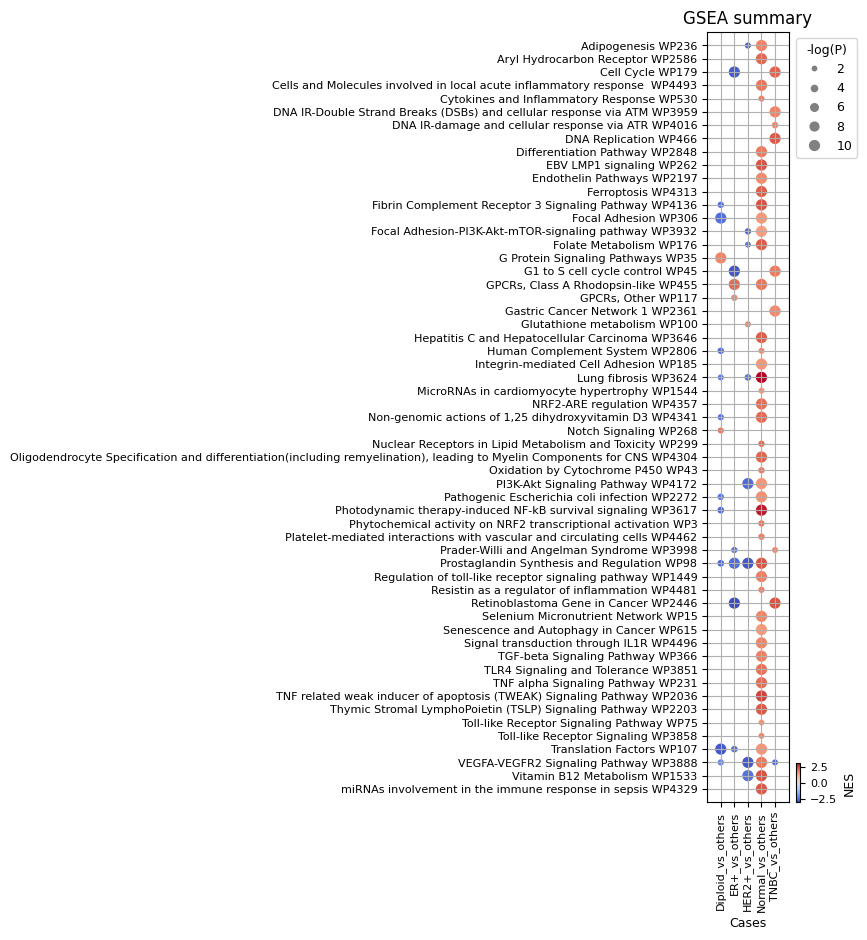

In [ ]:
gsea_res_t = gsea_res['Epithelial cell']
pval_cutoff = 1e-2

plot_gsa_dot( gsea_res_t, pval_cutoff = pval_cutoff,
              title = 'GSEA summary', title_fs = 12,
              tick_fs = 8, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 9, legend_fs = 9, swap_ax = False, figsize = (1.2,10),
              dpi = 100, dot_size = 50, cbar_frac = 0.1, cbar_aspect = 10,
              cmap = 'coolwarm' )

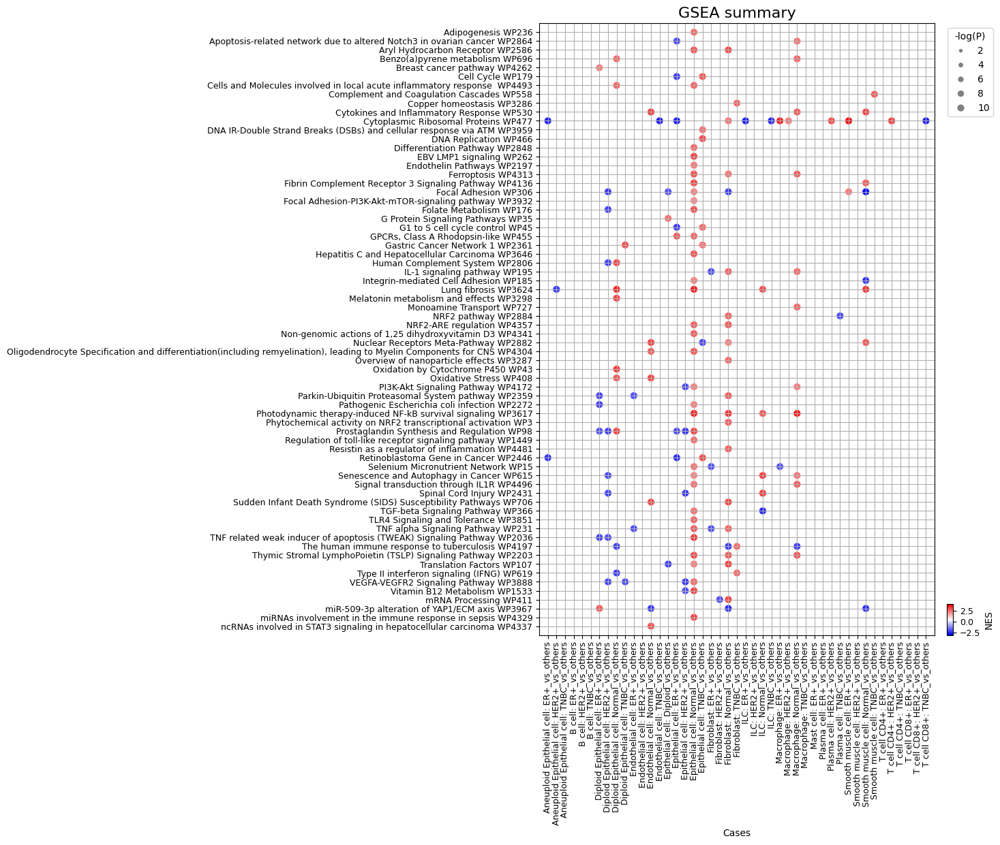

In [ ]:
plot_gsa_dot( gsea_res, pval_cutoff = 1e-4,
              title = 'GSEA summary', title_fs = 16,
              tick_fs = 9, xtick_rot = 90, xtick_ha = 'center',
              label_fs = 10, legend_fs = 10, swap_ax = False,
              figsize = None, dpi = 100, dot_size = 40,
              cbar_frac = 0.2, cbar_aspect = 5, cmap = 'bwr' )

### __G. Validation of discovered markers/targets in a multi-omics cancer genomics dataset (METABRIC)__

#### __G.1 Install and import required packages__

In [ ]:
!pip install mlbi-lab
!pip install lifelines

In [ ]:
import pandas as pd
import seaborn as sns

from mlbi.datasets import load_data, load_anndata
from mlbi.survival import plot_survival

https://github.com/combio-dku


#### __G.2 Load and check data__

In [ ]:
adata_metabric = load_anndata('metabric')
adata_metabric

Loading METABRIC data .. done


AnnData object with n_obs × n_vars = 1898 × 24368
    obs: 'LYMPH_NODES_EXAMINED_POSITIVE', 'NPI', 'CELLULARITY', 'CHEMOTHERAPY', 'COHORT', 'ER_IHC', 'HER2_SNP6', 'HORMONE_THERAPY', 'INFERRED_MENOPAUSAL_STATE', 'INTCLUST', 'AGE_AT_DIAGNOSIS', 'OS_MONTHS', 'OS_STATUS', 'CLAUDIN_SUBTYPE', 'THREEGENE', 'VITAL_STATUS', 'LATERALITY', 'RADIO_THERAPY', 'HISTOLOGICAL_SUBTYPE', 'BREAST_SURGERY', 'SAMPLE_ID', 'CANCER_TYPE', 'CANCER_TYPE_DETAILED', 'ER_STATUS', 'HER2_STATUS', 'GRADE', 'ONCOTREE_CODE', 'PR_STATUS', 'SAMPLE_TYPE', 'TUMOR_SIZE', 'TUMOR_STAGE', 'group', 'grade', 'size', 'stage', 'lymph_nodes_positive', 'lymph_nodes_removed', 'histological_type', 'ER_IHC_status', 'HER2_IHC_status', 'HER2_SNP6_state', 'cellularity', 'Pam50Subtype', 'IntClustMemb', 'Treatment', 'Site', 'PAM50.class', 'HER2_IHC', 'HER2.Status.org', 'HER2.Status', 'Age', 'Status', 'Year', 'Vital.Status', 'ER.Status', 'PR.Status', 'Patho.Stage', 'chemo.therapy', 'hormone.therapy', 'target.mole.therapy', 'PAM50_CL.class', '

In [ ]:
gene = 'DSC2'
group = 'subtype'
os_time = 'OS_MONTHS'
os_event = 'OS_STATUS'

In [ ]:
adata_metabric.obs[group].value_counts()

In [ ]:
df_log_gep = adata_metabric.to_df()

df_clinical = adata_metabric.obs[[group, os_time, os_event]].copy(deep=True)
df_clinical[gene] = df_log_gep[gene].copy(deep=True)

In [ ]:
df_clinical.head()

In [ ]:
df_clinical[os_event].replace( {'LIVING': 0, 'DECEASED': 1}, inplace = True )

In [ ]:
rend = {'Lum.A': 'Luminal', 'Lum.B': 'Luminal'}
df_clinical[group].replace(rend, inplace = True)

In [ ]:
df_clinical[group].value_counts()

In [ ]:
df_clinical.head()

#### __G.3 Check gene expressions across conditions (breast cancer subtype)__

<Axes: xlabel='subtype', ylabel='DSC2'>

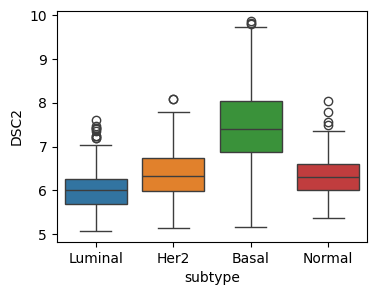

In [ ]:
plt.figure(figsize = (4,3))
sns.boxplot(data = df_clinical, y = gene, x = group, hue = group)

Text(0.5, 1.0, 'Gene expression in bulk RNA-seq data')

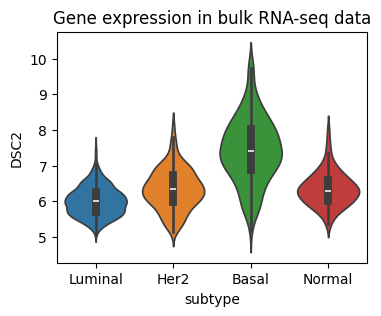

In [ ]:
plt.figure(figsize = (4,3))
sns.violinplot(data = df_clinical, y = gene, x = group, scale = 'width', hue = group)
plt.title('Gene expression in bulk RNA-seq data')

#### __G.4 Comparison of survival based on the expression level of a specific marker__

In [ ]:
target = 'Her2'
target = 'Basal'
# target = 'Luminal'

b = (df_clinical[group] == target)
dfc = df_clinical.loc[b, :].copy(deep=True)

dfc['%s_status' % gene] = '%s Med' % gene

b = dfc[gene] <= dfc[gene].quantile(0.3333)
dfc.loc[b, '%s_status' % gene] = '%s Low' % gene
nlow = np.sum(b)

b = dfc[gene] >= dfc[gene].quantile(0.6666)
dfc.loc[b, '%s_status' % gene] = '%s High' % gene
nhigh = np.sum(b)

b = dfc['%s_status' % gene] != '%s Med' % gene
dfc = dfc.loc[b,:]

dfc.head()

,subtype,OS_MONTHS,OS_STATUS,DSC2,DSC2_status
MB-6152,Basal,228.900000,0,6.400000,DSC2 Low
MB-5616,Basal,180.633333,0,7.033333,DSC2 Low
MB-0100,Basal,8.066667,1,8.000000,DSC2 High
MB-4769,Basal,21.700000,1,8.466667,DSC2 High
MB-3271,Basal,65.466667,1,8.466667,DSC2 High


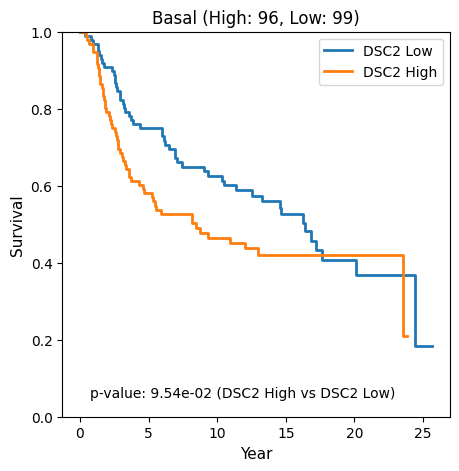

In [ ]:
events = dfc[os_event]
times = dfc[os_time]/12
groups = dfc['%s_status' % gene]

title = '%s (High: %i, Low: %i)' % (target, nhigh, nlow)
ref_group = '%s Low' % gene

plot_survival(events, times, groups, ref_group = ref_group, title = title,
              figsize = (5,5), title_fs = 12, label_fs = 11,
              tick_fs = 10, text_fs = 10, legend_fs = 10, grid = False,
              text_pos = (0.7, 0.05), xlabel = 'Year', ylabel = 'Survival')
plt.show()